In [1]:
"""
Scratch work/debug notebook
"""
import sys
import os.path

path = "~/apps/kratos/visual"

full_path = os.path.expanduser(path)

%env KRATOS_VISUAL_DIR=$full_path
sys.path.append( "../visual" )
from proxy import *
from matplotlib import rc

rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})

plt.rcParams[ "text.usetex" ] = True
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
%autoreload 2
#%aimport binary_io
#%aimport hydro_data
#%aimport slice_plot
#%aimport cmz_init
%aimport proxy
%matplotlib inline

env: KRATOS_VISUAL_DIR=/home/cmz_colab/apps/kratos/visual


soxs : [WARNING  ] 2026-06-29 15:23:30,177 Setting 'soxs_data_dir' to /home/cmz_colab/.cache/soxs for this session. Please update your configuration if you want it somewhere else.


In [ ]:
from yt.data_objects.level_sets.api import *

ds = dyt.disk( [ 0,0,0 ], [ 0, 0, 1 ], ( 12, "kpc" ), ( 500, "pc" ) )
master_clump = Clump( ds, ( "gas", "density" ) )
c_min = ds["gas", "density"].min()
c_max = ds["gas", "density"].max()
step = 10.0
find_clumps(master_clump, c_min, c_max, step)
master_clump[ "gas", "density"]
slc = yt.ProjectionPlot(dyt, "z", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**2")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
slc.annotate_clumps( master_clump.leaves )
slc.show()

In [ ]:
clumpmasses = []
for clump in master_clump:
    clumpmasses.append( np.sum( clump["gas","mass"] ) )
clumpmasses = np.array( clumpmasses )
for clump in master_clump:
    print( clump[ "gas"])
logcm = np.log10( clumpmasses )
bins = 10**np.linspace( logcm.min(), logcm.max(), 40 )
plt.hist( clumpmasses, bins=bins )
plt.plot( bins, 10**18*bins**-2, '--k' )
plt.xscale('log')
plt.yscale('log')
plt.xlim( [ 1e5, 1e10 ] )
plt.ylim( [ 1e0, 1e2 ] )
fn = master_clump.save_as_dataset(fields=["density", "mass"])

In [ ]:
from matplotlib.ticker import FuncFormatter
import pyxsim
from math import floor
D = 8000
def y_to_angle( y, pos ):
    theta = np.arctan(y / D)
    return f"{np.degrees(theta):.2f}°"
def x_to_RA( x, pos ):
    theta = np.arctan(-x / D)
    if theta < 0:
        theta += 2*np.pi#- theta
    RA = theta * 12 / np.pi
    hour = int( floor( RA ) )
    min = round( ( RA - hour ) * 60 )
    return f"{hour} h {min}"

runs = { "cmz_fid4_b10_v2":58 }

for runname, outmax in runs.items():
    for out in range( outmax ):
        d  = get_last_dd(  f'../../cmz/cmz_test/outputs/{runname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
        enroll_T( d )
        dyt = load_kratos_yt( d )
        dyt.field_info["athena_pp", "temperature"].units = "K"
        dyt.field_info["athena_pp", "temperature"].output_units = "K"
        thermal_model  = pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, ( "athena_pp", "metallicity" ), 
                                       kT_min=0.2, emission_measure_field=( "gas", "density" ),
                                        temperature_field=( "athena_pp", "temperature" )  )#pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, ( "athena_pp", "metallicity" ), kT_min=0.2, emission_measure_field=( "gas", "density" )  )
        xray = thermal_model.make_source_fields( dyt, 0.6, 1 )
        prj = yt.ProjectionPlot(
            dyt, "x", ("gas", 'xray_photon_count_rate_0.6_1_keV') )
        prj.set_axes_unit( 'pc' )
        prj.set_ylabel('Galactic Latitude')
        prj.set_xlabel('Right Ascension')

        prj._setup_plots()from matplotlib import rc
        ax = prj.plots[("gas", 'xray_photon_count_rate_0.6_1_keV')].axes
        ax.yaxis.set_major_formatter(FuncFormatter(y_to_angle))
        ax.xaxis.set_major_formatter(FuncFormatter(x_to_RA))
        prj.show()
        prj.save( f"../../cmz/paper_plots/snap_plots/{runname}_xray_{out}.png")#, bbox_inches='tight' )
    
#out = 55
#d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_b10_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
#d2  = get_last_dd( f'../../cmz/cmz_test/outputs/cmz_fid4_b60_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );


file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00030.bin; time = 150
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00030.bin; time = 150
x0 not found


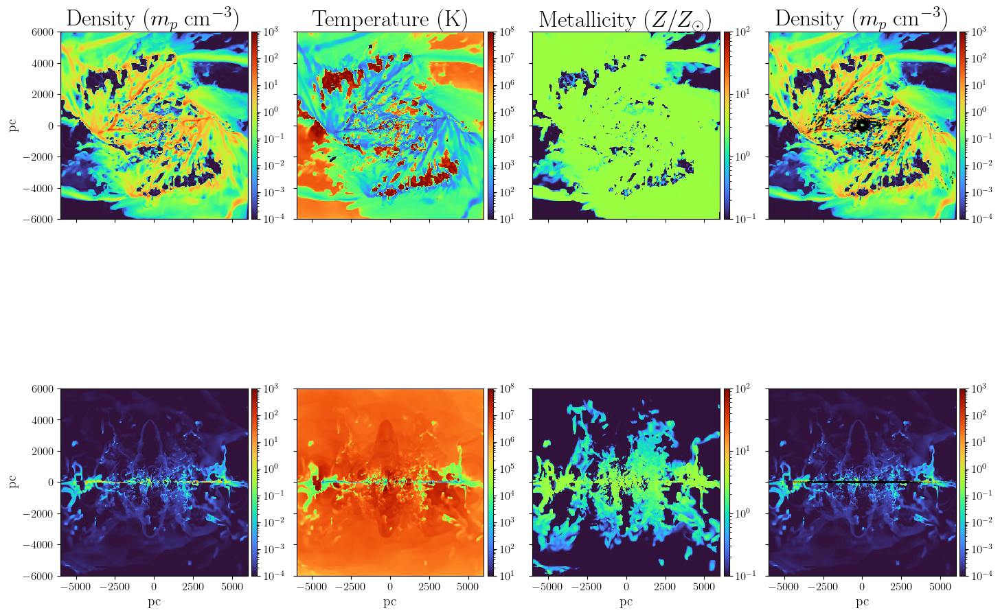

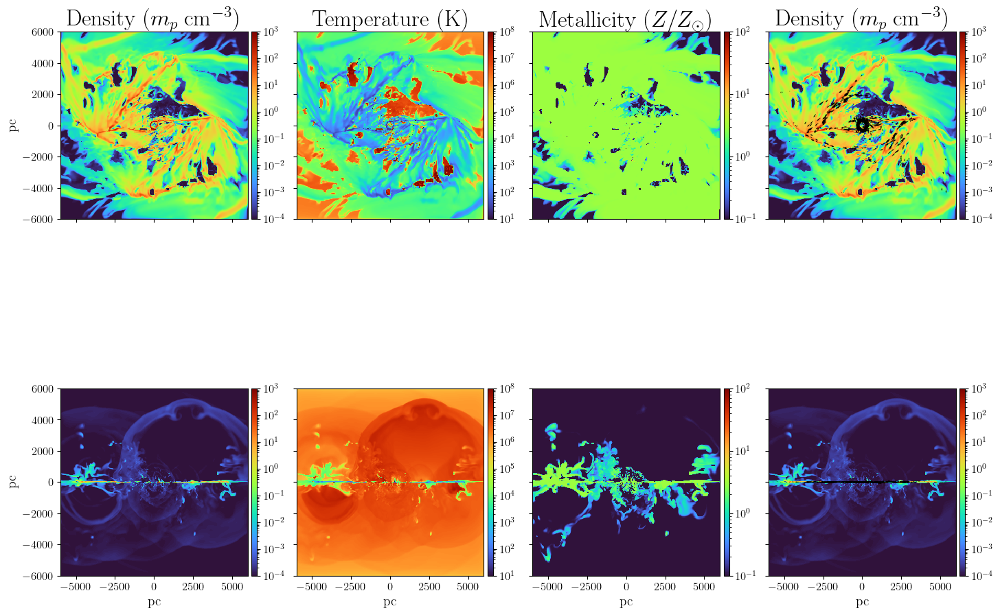

In [17]:
out = 30
d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_b10_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
d2  = get_last_dd( f'../../cmz/cmz_test/outputs/cmz_fid4_b60_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
fig = f_plot_grid( d,  figsize=( 17, 13.5 )# , 
                    ,xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ] 
                    ,ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ]
                    #,xlims = [ ( -12000, 12000 ), ( -12000, 12000 ) ] 
                    #,ylims = [ ( -12000, 12000 ), ( -12000, 12000 ) ]
                    #log   = [ True, True, True, False ],
                    #locs  = [ [ 1e-2, 1e-2, 1e-2, 2 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    #z0s   = [ 1, 1, 1, 1, -1 ],
                    #flds  = [ 'rho', 'T_ent', 'met', 'rho' ],
                    #zlims = [ ( 1e-4, 1e4 ), ( 1e1, 1e8 ), ( 1e-1, 1e2 ), ( 1e-2, 1e3 ) ],
                    #part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )
fig = f_plot_grid( d2,  figsize=( 17, 13.5 )# , 
                    ,xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ] 
                    ,ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ]
                    #,xlims = [ ( -12000, 12000 ), ( -12000, 12000 ) ] 
                    #,ylims = [ ( -12000, 12000 ), ( -12000, 12000 ) ]
                    #log   = [ True, True, True, False ],
                    #locs  = [ [ 1e-2, 1e-2, 1e-2, 2 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    #z0s   = [ 1, 1, 1, 1, -1 ],
                    #flds  = [ 'rho', 'T_ent', 'met', 'rho' ],
                    #zlims = [ ( 1e-4, 1e4 ), ( 1e1, 1e8 ), ( 1e-1, 1e2 ), ( 1e-2, 1e3 ) ],
                    #part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )

In [3]:
dyt = load_kratos_yt( d )

yt : [WARNING  ] 2026-06-29 15:29:03,735 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-29 15:29:03,736 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-29 15:29:03,737 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-29 15:29:03,738 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-29 15:29:03,739 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-29 15:29:03,805 Parameters: current_time              = 250.00002307998122
yt : [INFO     ] 2026-06-29 15:29:03,806 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-29 15:29:03,807 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-29 15:29:03,808 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-29 15:29:03,808 Parameters: cosmological_simulation   = 0


In [10]:
N=256
left  = [-750, -750, -750]
right = [ 750,  750, 750]
dims  = [N, N, N]
grid = dyt.arbitrary_grid(left, right, dims)
vx = grid[("gas", "velocity_x")].in_units( "km/s" )
vy = grid[("gas", "velocity_y")].in_units( "km/s" )
vz = grid[("gas", "velocity_z")].in_units( "km/s" )

In [11]:
    vx = vx.d.reshape(dims)
    vy = vy.d.reshape(dims)
    vz = vz.d.reshape(dims)
    rho = grid[("gas", "density")].d.reshape(dims)

    # subtract bulk flow
    vx -= np.mean(vx)
    vy -= np.mean(vy)
    vz -= np.mean(vz)

    # ---- 3D FFT ----
    Lx = 2.0 * 750
    dx = Lx / N
    k_fac = 2.0 * np.pi / Lx

    vx_k = np.fft.fftn(vx) * dx**3
    vy_k = np.fft.fftn(vy) * dx**3
    vz_k = np.fft.fftn(vz) * dx**3

    # ---- k-space grid ----
    k1d = np.fft.fftfreq(N, d=dx) * 2.0 * np.pi
    kx, ky, kz = np.meshgrid(k1d, k1d, k1d, indexing="ij")
    k_mag = np.sqrt(kx**2 + ky**2 + kz**2)

    # ---- radial binning ----
    k_max = np.pi / dx                       # Nyquist
    N_bins = N // 2
    k_edges = np.linspace(0, k_max, N_bins + 1)
    k_cen = 0.5 * (k_edges[:-1] + k_edges[1:])

In [13]:
dx

5.859375

file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00030.bin; time = 150


yt : [WARNING  ] 2026-06-28 17:30:01,475 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-28 17:30:01,477 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-28 17:30:01,478 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-28 17:30:01,479 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-28 17:30:01,479 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-28 17:30:01,520 Parameters: current_time              = 150.00012701208837
yt : [INFO     ] 2026-06-28 17:30:01,521 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-28 17:30:01,522 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-28 17:30:01,522 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-28 17:30:01,523 Parameters: cosmological_simulation   = 0


file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00030.bin; time = 150


yt : [WARNING  ] 2026-06-28 17:30:26,813 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-28 17:30:26,815 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-28 17:30:26,816 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-28 17:30:26,817 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-28 17:30:26,819 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-28 17:30:26,859 Parameters: current_time              = 150.0001481262494
yt : [INFO     ] 2026-06-28 17:30:26,860 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-28 17:30:26,860 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-28 17:30:26,861 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-28 17:30:26,862 Parameters: cosmological_simulation   = 0


file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00050.bin; time = 250


yt : [WARNING  ] 2026-06-28 17:30:56,743 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-28 17:30:56,744 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-28 17:30:56,745 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-28 17:30:56,746 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-28 17:30:56,747 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-28 17:30:56,787 Parameters: current_time              = 250.00003626473148
yt : [INFO     ] 2026-06-28 17:30:56,788 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-28 17:30:56,789 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-28 17:30:56,790 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-28 17:30:56,794 Parameters: cosmological_simulation   = 0


file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00050.bin; time = 250


yt : [WARNING  ] 2026-06-28 17:31:28,338 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-28 17:31:28,339 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-28 17:31:28,340 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-28 17:31:28,341 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-28 17:31:28,342 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-28 17:31:28,383 Parameters: current_time              = 250.00002307998122
yt : [INFO     ] 2026-06-28 17:31:28,383 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-28 17:31:28,384 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-28 17:31:28,385 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-28 17:31:28,386 Parameters: cosmological_simulation   = 0


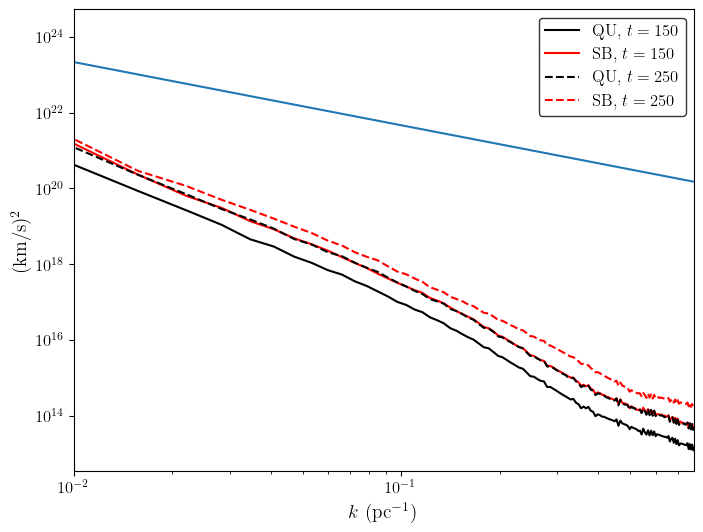

In [ ]:
from power_spectrum import *
f,ax = plt.subplots( 1, 1, figsize=( 8, 6 ) )
for out, ls in zip( [ 30, 50 ], [ "-", "--" ] ) :
    for prefix, model, c in zip( [ "b60", "b10" ],
                                 [ "QU", "SB" ],
                                 [ "k", "r" ] ):
        d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_{prefix}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
        dyt = load_kratos_yt( d )
        k, Pk = power_spectrum( dyt, R_cut=750, z_cut=750, N=256 )
        ax.plot( k[1:], Pk[1:], f"{ls}{c}", label=rf"{model}, $t = {round( d.globals['time'] )}$" )

ax.set_xscale('log')
ax.set_yscale('log')
ax.legend()
ax.set_xlim( [ 1e-2, np.pi/4 ] )
ax.set_xlabel( r"$k$ (pc$^{-1}$)" )
ax.set_ylabel( r"(km/s)$^2$" )
ax.plot( k, 1e20*k**-(5/3) )



In [11]:
ax.plot( k, 1e20*k**-2 )
plt.show()

yt : [WARNING  ] 2026-06-29 19:00:26,847 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-06-29 19:00:26,849 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-06-29 19:00:26,850 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-06-29 19:00:26,850 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-06-29 19:00:26,851 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-06-29 19:00:26,889 Parameters: current_time              = 150.0001481262494
yt : [INFO     ] 2026-06-29 19:00:26,890 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-06-29 19:00:26,891 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-06-29 19:00:26,892 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-06-29 19:00:26,892 Parameters: cosmological_simulation   = 0
yt : [WARNING  ] 2026-06-29 19:01:16,606 Over

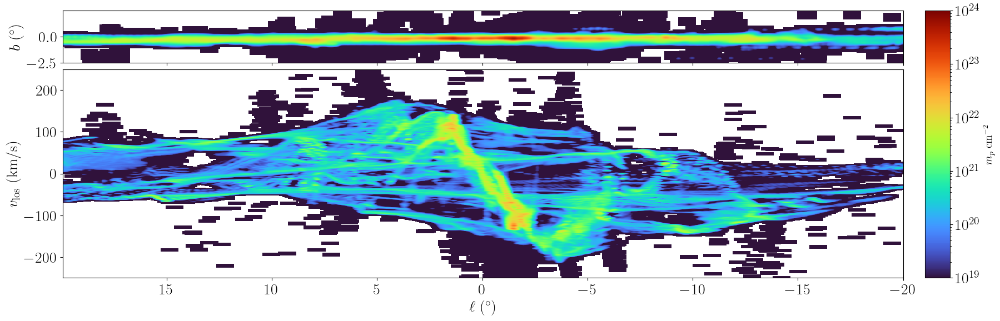

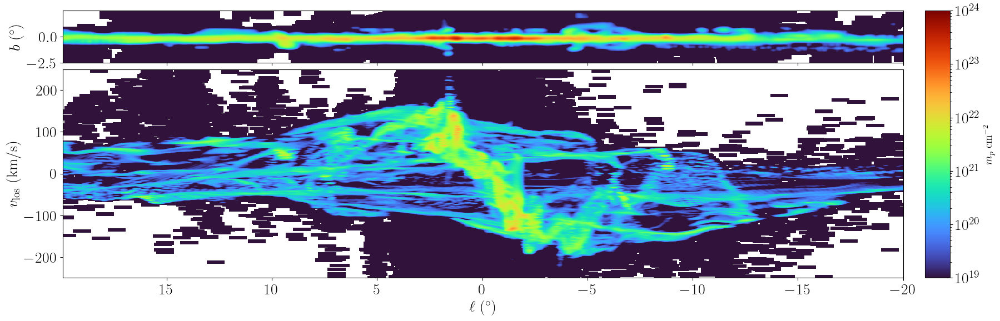

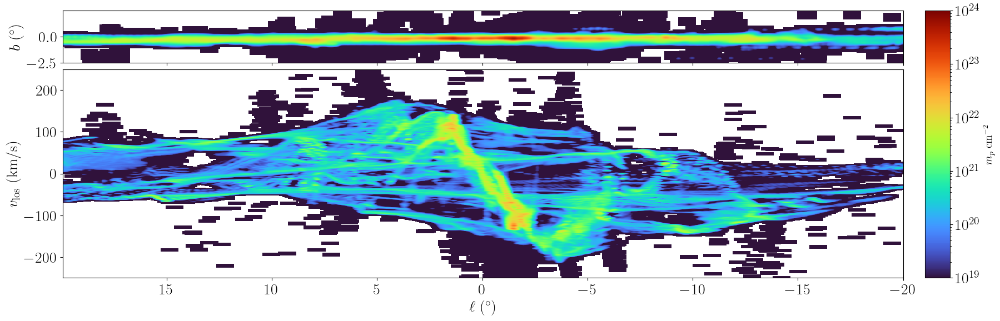

In [20]:
#plt.rcParams[ "font.size" ] = 20
plot_lvd( d, lbins=np.arange( -20, 20, 0.05 ), 
             bbins=np.arange( -2.5, 2.5, 0.05 ), 
             vbins=np.arange(-250, 250, 0.5 ), 
             reflect = 'yz',
             tempcut=200, 
             sigma_lb = ( 2, 2 ), 
             sigma_lv = ( 2, 2 ),
             figsize_base = ( 20, 5 ),
             fontsize = 20,
             vmax=1e24,
             savefile="../../cmz/paper_plots/SB_lvd_t150_T200.png" )
plot_lvd( d2, lbins=np.arange( -20, 20, 0.05 ), 
             bbins=np.arange( -2.5, 2.5, 0.05 ), 
             vbins=np.arange(-250, 250, 0.5 ), 
             reflect = 'yz',
             tempcut=200, 
             sigma_lb = ( 2, 2), 
             sigma_lv = ( 2, 2 ),
             figsize_base = ( 20, 5 ),
             fontsize = 20,
             vmax=1e24,
             savefile="../../cmz/paper_plots/QU_lvd_t150_T200.png" )

In [21]:
out = 50
d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_b10_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
#dyt = load_kratos_yt( d )

file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00050.bin; time = 250


In [ ]:
enroll_T( d )
dens = []
temp = []
for

yt : [INFO     ] 2026-06-26 20:23:39,056 Projection completed
yt : [INFO     ] 2026-06-26 20:23:39,065 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-26 20:23:39,066 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-26 20:23:39,068 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-26 20:23:39,069 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-26 20:23:39,077 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern



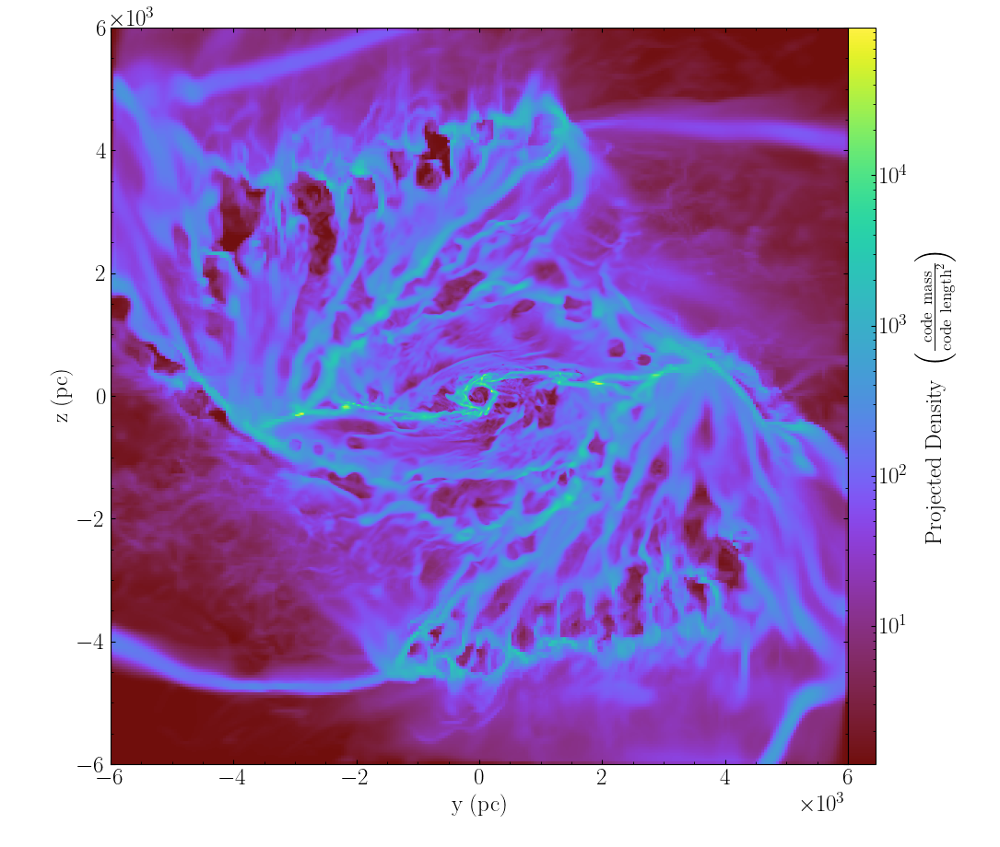

In [178]:
prj = yt.ProjectionPlot(dyt, "z", ("gas", "density"))#, weight_field=("gas","density"))
#prj.set_cmap(("gas", "density"), "turbo")
#prj.set_unit(("gas", "density"), "mp/cm**2")
prj.set_axes_unit( 'pc' )
prj.set_xlabel('y (pc)')
prj.set_ylabel('z (pc)')
#prj.set_cmap(("gas", "velocity_x"), "seismic")
prj.show()

In [18]:
lsr_u = 10.6 # km/s
lsr_v = 10.7
lsr_w = 7.6
v_lsr = 236
rsun  = 8150
phisun = 28
phisun += 180
barpattern = 40 #km/s/kpc
xsun = rsun*np.cos(phisun*np.pi/180.)
ysun = rsun*np.sin(phisun*np.pi/180.)
zsun = 25
rsunvec = np.array( [ xsun, ysun, zsun ] )
omega_sun = (v_lsr+lsr_v)/rsun - barpattern / 1000
velxsun = -omega_sun*ysun - (lsr_u)*np.cos(phisun*np.pi/180.)
velysun =  omega_sun*xsun - (lsr_u)*np.sin(phisun*np.pi/180.)
velzsun = lsr_w

ad = dyt.all_data()
vx = np.array( ad['velocity_x'].in_units( "km/s" ) )
vy = np.array( ad['velocity_y'].in_units( "km/s" ) )
vz = np.array( ad['velocity_z'].in_units( "km/s" ) )
x  = np.array( ad['x'].in_units( "pc" ) )
y  = np.array( ad['y'].in_units( "pc" ) )
z  = np.array( ad['z'].in_units( "pc" ) )
x = -x
vx = -vx
den = np.array(  ad['gas','density'].in_units( "mp/cm**3" ) )
temp = np.array( ad["athena_pp","temperature"] )

In [19]:
#datavec = rsunvec[:2] - np.c_[x,y]
#solarvec = np.ones_like(datavec)*rsunvec[:2]
#cosang = np.einsum("ij,ij->i",datavec, solarvec)
#sinang = np.cross(datavec, solarvec)
#longitude = np.arctan2(sinang, cosang)*180./np.pi
gc_dir   = -rsunvec[:2] / np.linalg.norm(rsunvec[:2])   # Sun → GC unit vector
datavec  = np.c_[x, y] - rsunvec[:2]                    # Sun → cell
solarvec = np.ones_like(datavec) * gc_dir

cosang    = np.einsum("ij,ij->i", datavec, solarvec)
sinang    = np.cross(datavec, solarvec)
longitude = -np.arctan2(sinang, cosang) * 180. / np.pi
dist_xy  = np.sqrt((x - xsun)**2 + (y - ysun)**2)   # pc, projected separation
latitude = np.arctan2(z - zsun, dist_xy) * 180. / np.pi 

In [20]:
e_LOS = np.array([x-xsun, y-ysun, z-zsun])/np.sqrt((x-xsun)**2+(y-ysun)**2+((z-zsun)**2))


In [21]:
dx_cm = np.array(ad[('index', 'dx')].in_units('cm'))
dy_cm = np.array(ad[('index', 'dy')].in_units('cm'))
dz_cm = np.array(ad[('index', 'dz')].in_units('cm'))

# Half-widths of each cell
hx = dx_cm / 2.
hy = dy_cm / 2.
hz = dz_cm / 2.

# e_LOS components (3, N) — unit vector from Sun through each cell centre
ex = e_LOS[0]
ey = e_LOS[1]
ez = e_LOS[2]

# Slab intersection: for each axis, find the t-values at which the ray
# enters and exits the cell slab [ centre - h, centre + h ].
# Ray: p(t) = cell_centre + t * e_LOS  (t=0 at cell centre)
# For axis i: t = ±h_i / |e_i|  (avoid division by zero with np.where)

tiny = 1e-30   # prevents divide-by-zero for LOS perpendicular to an axis

tx = hx / np.where(np.abs(ex) > tiny, np.abs(ex), tiny)
ty = hy / np.where(np.abs(ey) > tiny, np.abs(ey), tiny)
tz = hz / np.where(np.abs(ez) > tiny, np.abs(ez), tiny)

# Entry = max of the three lower slab bounds
# Exit  = min of the three upper slab bounds
# Path length = exit - entry, clamped to >= 0
t_enter = np.maximum.reduce([-tx, -ty, -tz])   # most restrictive entry
t_exit  = np.minimum.reduce([ tx,  ty,  tz])   # most restrictive exit

dl = np.maximum(t_exit - t_enter, 0.)   # cm; 0 if ray misses (shouldn't happen)

col_den = den * dl   # mp/cm^2

In [22]:
vgrid_proj = np.sum(np.array([vx,vy,vz])*e_LOS,axis=0)
vsunvecarray = np.ones_like(e_LOS)
vsunvecarray[ 0 ] = velxsun
vsunvecarray[ 1 ] = velysun
vsunvecarray[ 2 ] = velzsun
vsun_proj  = np.sum(vsunvecarray*e_LOS,axis=0)
vel_los = vgrid_proj-vsun_proj
lv_l = longitude.ravel()
lv_b = latitude.ravel()
lv_v = vel_los.ravel()
lv_d = den.ravel()
lv_cden = col_den.ravel()
lv_COcden = lv_cden
lv_COcden[ temp > 200 ] = 0

deltal = 0.01
deltav = 1.
lmin   = -20.
lmax   =  20.
vmin   = -300.
vmax   =  300.
bmin   = -2
bmax   = 2
deltab = 0.01
ledge = np.linspace(lmin,lmax,int((lmax-lmin)/deltal+1))
vedge = np.linspace(vmin,vmax,int((vmax-vmin)/deltav+1))
bedge = np.linspace(bmin,bmax,int((bmax-bmin)/deltab+1))


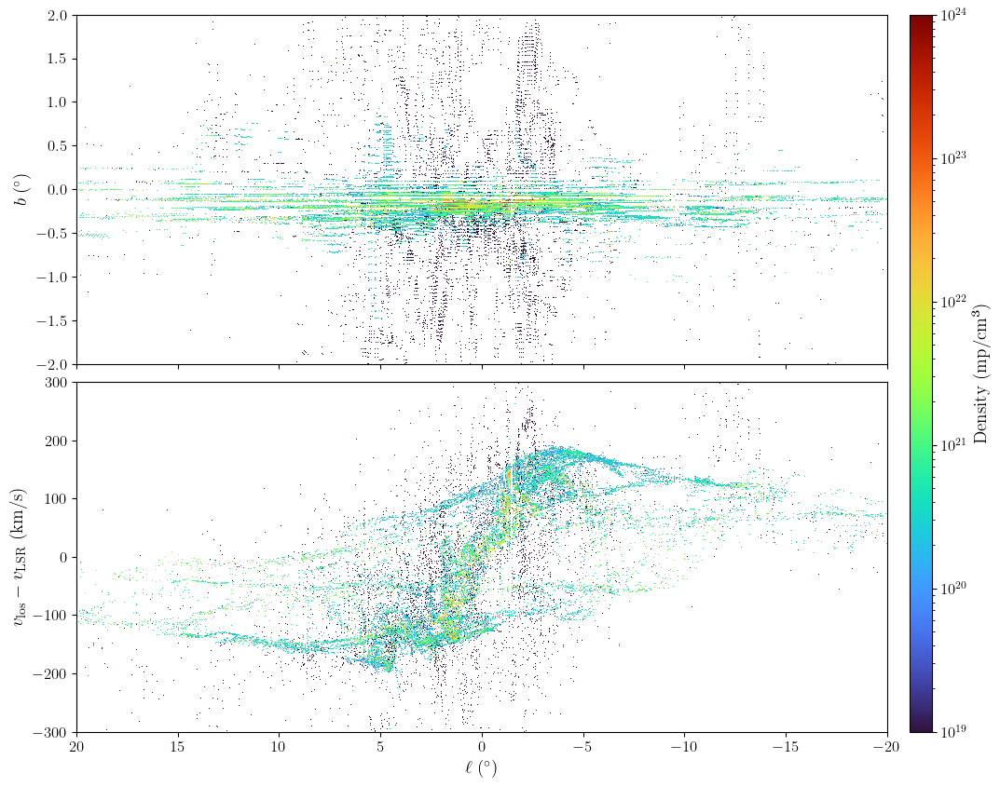

In [184]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import gaussian_kde

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
fig.subplots_adjust(hspace=0.05, right=0.85)

# Shared normalisation
norm = colors.LogNorm(vmin=1e19,vmax=1e24)#vmin=1e-3,vmax=1e5)

# ── Top: edge-on (l-b) map ────────────────────────────────────────────────────
_, _, _, im1 = ax1.hist2d(lv_l, lv_b, weights=lv_COcden,
                           bins=[ledge, bedge],
                           cmap='turbo', norm=norm )
ax1.set_ylabel(r'$b \; (^\circ)$')
ax1.set_ylim(bmin, bmax)

# ── Bottom: longitude-velocity diagram ────────────────────────────────────────
lvplot, xedge, yedge, im2 = ax2.hist2d(lv_l, lv_v, weights=lv_COcden,
                                         bins=[ledge, vedge],
                                         cmap='turbo', norm=norm )
ax2.set_ylabel(r'$v_\mathrm{los} - v_\mathrm{LSR}$ (km/s)')
ax2.set_xlabel(r'$\ell \; (^\circ)$')
ax2.set_xlim(lmax, lmin)   # longitude increases to the left
ax2.set_ylim(vmin, vmax)

# ── Envelopes on the LVD ──────────────────────────────────────────────────────
#lcentres = (ledge[:-1] + ledge[1:]) / 2.
#for i in range(int((lmax - lmin) / deltal)):
#    vslice = lvplot[i, :]
#    idx    = np.where(vslice > 0.2)[0]
#    if len(idx) > 0:
#        envelope_upper[i] = vedge[idx[-1]]
#        envelope_lower[i] = vedge[idx[0]]

#ax2.plot(lcentres, envelope_upper, 'w-', lw=1.0)
#ax2.plot(lcentres, envelope_lower, 'w-', lw=1.0)

# ── Shared colourbar, full height of both panels ──────────────────────────────
cbar_ax = fig.add_axes([0.87, 0.11, 0.02, 0.77])   # [left, bottom, width, height]
fig.colorbar(im2, cax=cbar_ax, label='Density (mp/cm³)')




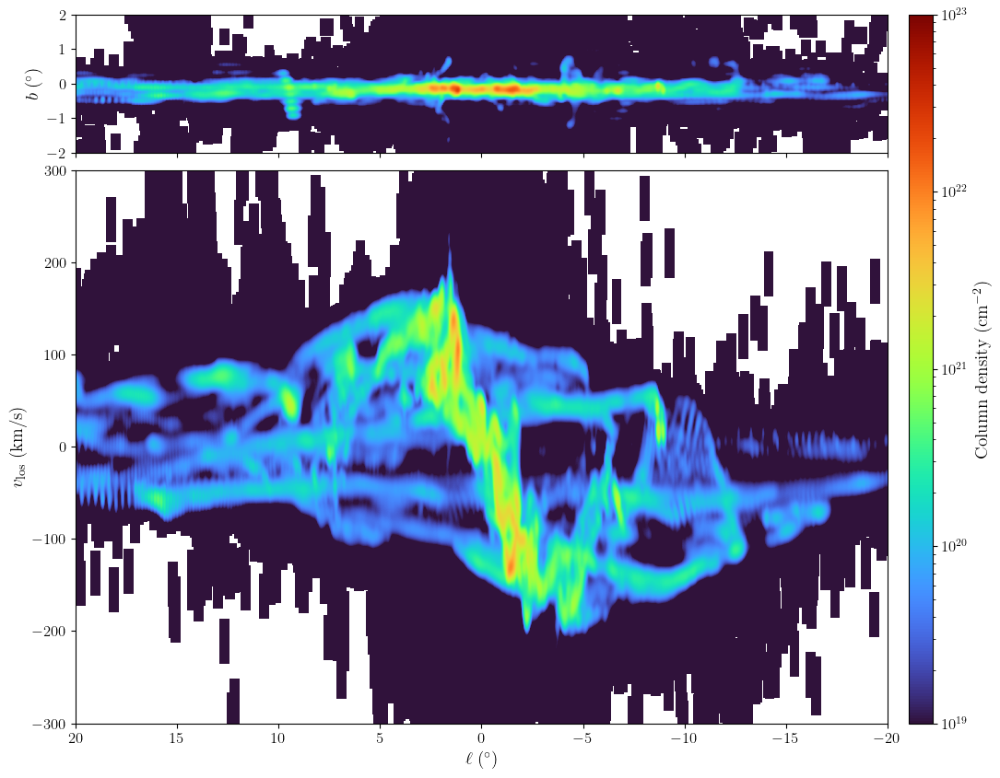

In [23]:
from scipy.ndimage import gaussian_filter
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(12, 10))
gs  = gridspec.GridSpec(2, 2, figure=fig,
                        width_ratios=[1, 0.03],
                        height_ratios=[0.25, 1],
                        hspace=0.05, wspace=0.05)

ax1     = fig.add_subplot(gs[0, 0])
ax2     = fig.add_subplot(gs[1, 0], sharex=ax1)
cbar_ax = fig.add_subplot(gs[:, 1])   # spans both rows

norm = LogNorm(vmin=1e19, vmax=1e23)

# ── Compute histograms and smooth ─────────────────────────────────────────────
sigma_lb = (6.0, 6.0)
sigma_lv = (6.0, 6.0)

h_lb, _, _ = np.histogram2d(lv_l, lv_b, weights=lv_cden, bins=[ledge, bedge])
h_lv, _, _ = np.histogram2d(lv_l, lv_v, weights=lv_cden, bins=[ledge, vedge])

h_lb_smooth = gaussian_filter(h_lb, sigma=sigma_lb)
h_lv_smooth = gaussian_filter(h_lv, sigma=sigma_lv)

h_lb_smooth[h_lb_smooth == 0] = np.nan
h_lv_smooth[h_lv_smooth == 0] = np.nan

# ── Top: l-b map ──────────────────────────────────────────────────────────────
im1 = ax1.pcolormesh(ledge, bedge, h_lb_smooth.T,
                     cmap='turbo', norm=norm, shading='flat')
ax1.set_ylabel(r'$b \; (^\circ)$')
ax1.set_ylim(bmin, bmax)
ax1.set_xlim(lmax, lmin)
ax1.tick_params(labelbottom=False)   # hide x tick labels on top panel

# ── Bottom: l-v diagram ───────────────────────────────────────────────────────
im2 = ax2.pcolormesh(ledge, vedge, h_lv_smooth.T,
                     cmap='turbo', norm=norm, shading='flat')
ax2.set_ylabel(r'$v_\mathrm{los}$ (km/s)')
ax2.set_xlabel(r'$\ell \; (^\circ)$')
ax2.set_xlim(lmax, lmin)
ax2.set_ylim(vmin, vmax)

# ── Shared colourbar ──────────────────────────────────────────────────────────
fig.colorbar(im2, cax=cbar_ax, label=r'Column density (cm$^{-2}$)')

#plt.savefig('lv_lb_combined.png', dpi=150, bbox_inches='tight')
#plt.show()

In [103]:
dx_cm = np.array(ad[('index', 'dx')].in_units('cm'))
dy_cm = np.array(ad[('index', 'dy')].in_units('cm'))
dz_cm = np.array(ad[('index', 'dz')].in_units('cm'))

# Half-widths of each cell
hx = dx_cm / 2.
hy = dy_cm / 2.
hz = dz_cm / 2.

# e_LOS components (3, N) — unit vector from Sun through each cell centre
ex = e_LOS[0]
ey = e_LOS[1]
ez = e_LOS[2]

# Slab intersection: for each axis, find the t-values at which the ray
# enters and exits the cell slab [ centre - h, centre + h ].
# Ray: p(t) = cell_centre + t * e_LOS  (t=0 at cell centre)
# For axis i: t = ±h_i / |e_i|  (avoid division by zero with np.where)

tiny = 1e-30   # prevents divide-by-zero for LOS perpendicular to an axis

tx = hx / np.where(np.abs(ex) > tiny, np.abs(ex), tiny)
ty = hy / np.where(np.abs(ey) > tiny, np.abs(ey), tiny)
tz = hz / np.where(np.abs(ez) > tiny, np.abs(ez), tiny)

# Entry = max of the three lower slab bounds
# Exit  = min of the three upper slab bounds
# Path length = exit - entry, clamped to >= 0
t_enter = np.maximum.reduce([-tx, -ty, -tz])   # most restrictive entry
t_exit  = np.minimum.reduce([ tx,  ty,  tz])   # most restrictive exit

dl = np.maximum(t_exit - t_enter, 0.)   # cm; 0 if ray misses (shouldn't happen)


In [107]:
ad["cell_mass"].in_units("mp")

unyt_array([3.02409522e+56, 3.02409522e+56, 3.02409522e+56, ...,
       5.96449584e+53, 5.90643598e+53, 5.90643598e+53], 'mp')

In [90]:
nan_mask = np.isnan(lv_b)
print(f"Total cells     : {len(lv_b)}")
print(f"NaNs in lv_b    : {nan_mask.sum()}")

if nan_mask.sum() > 0:
    print(f"NaN fraction    : {nan_mask.mean()*100:.3f}%")
    # Check which inputs produced NaNs
    print(f"  NaNs from z   : {np.isnan(z).sum()}")
    print(f"  NaNs from x   : {np.isnan(x).sum()}")
    print(f"  NaNs from y   : {np.isnan(y).sum()}")
    print(f"  Zero dist_xy  : {(dist_xy == 0.).sum()}")  # arctan2(z,0) is fine but worth knowing
else:
    print("No NaNs found in lv_b")

Total cells     : 60817408
NaNs in lv_b    : 0
No NaNs found in lv_b


In [5]:
Rsun = 8000
phi_sun = 25
barspeed = 40 #km/s/kpc
vlsr     = 255 - 40 * Rsun/1000

phi_sun = ( phi_sun + 180 ) * np.pi / 180
xsun = Rsun * np.cos( phi_sun )
ysun = Rsun * np.sin( phi_sun )
x1 = ( xsun, ysun, 0 )

Lray = 2e4
lrange = np.linspace(-20,60,120)
brange = np.linspace(-4, 4, 20 )
L,B = np.meshgrid( lrange, brange, indexing='ij' )
Sigma = np.zeros( L.shape )
Vlos  = np.zeros( L.shape )
for il, l in enumerate( lrange ):
    for ib, b in enumerate( brange ):
        print( f"{il}/{len(lrange)}, {ib}/{len(brange)}     ", end="\r" )
        l_ = ( l + phi_sun ) * np.pi / 180
        b_ = b  * np.pi / 180 + np.pi / 2
        x2x = Lray * np.sin( b_ ) * np.cos( l_ )
        x2y = Lray * np.sin( b_ ) * np.sin( l_ )
        x2z = Lray * np.cos( b_ )
        x2 = ( x1[ 0 ] + x2x, x1[ 1 ] + x2y, x1[ 2 ] + x2z )

# Create the ray
        ray = dyt.ray(x1, x2)

# Physical length of the ray
        start = dyt.arr(x1, "pc")
        end   = dyt.arr(x2, "pc")
        ray_length = np.sqrt(((end - start) ** 2).sum())

# Sort cells by position along the ray
        sort = np.argsort(ray["t"])

# "dts" (plural) is the correct field name — fractional chord length, sums to 1.0
        dl = (ray["dts"] * ray_length)[sort]

        density = ray["gas", "density"][sort]

# Surface density: Σ = ∫ ρ dl
        surface_density = (density * dl).sum()
        Sigma[ il, ib ] = surface_density

        vsq = ray["gas","velocity_x"]**2 + ray["gas","velocity_y"]**2 + ray["gas","velocity_z"]**2
        vel = np.array( [ray["gas","velocity_x"], ray["gas","velocity_y"], ray["gas","velocity_z"]] ).T
        vec = np.array( x2 ) - np.array( x1 )
        amp = np.dot( vel, vec ) / np.sum( vec**2 ) 
        vlosvec = amp[:,np.newaxis] * np.tile( vec, ( len( amp ), 1 ) )
        vlos = np.sign( amp ) * np.sqrt( np.sum( vlosvec**2, axis=-1 ) )
        vlos += vlsr
        Vlos[ il, ib ] = ( vlos * density * dl ).sum() / surface_density

#print(f"Surface density: {surface_density.in_cgs():.4e}")
#print(f"Surface density: {surface_density.in_units('Msun/pc**2'):.4e}")

yt : [WARNING  ] 2026-06-26 13:50:24,483 Ray start or end is outside the domain. Returned data will only be for the ray section inside the domain.


In [141]:
vsq = ray["gas","velocity_x"]**2 + ray["gas","velocity_y"]**2 + ray["gas","velocity_z"]**2
vel = np.array( [ray["gas","velocity_x"], ray["gas","velocity_y"], ray["gas","velocity_z"]] ).T
vec = np.array( x2 ) - np.array( x1 )
amp = np.dot( vel, vec ) / np.sum( vec**2 ) 
vlosvec = amp[:,np.newaxis] * np.tile( vec, ( len( amp ), 1 ) )
vlos = np.sqrt( np.sum( vlosvec**2, axis=-1 ) )

In [14]:
( vlos * density * dl ).sum() / surface_density

unyt_quantity(-7323.96638074, '(dimensionless)')

In [18]:
np.sign( amp) * np.sqrt( np.sum( vlosvec**2, axis=-1 ) )

array([ 1.18620195e+02,  1.22346858e+02,  1.21550598e+02,  1.35125904e+02,
        1.31134799e+02,  1.27370458e+02,  1.34910044e+02,  1.31614066e+02,
        1.30399239e+02,  1.33354055e+02,  1.32639463e+02,  1.31336038e+02,
        1.34330539e+02,  1.34806770e+02,  1.34787881e+02,  1.38265354e+02,
        1.39218606e+02,  1.40515472e+02,  1.41632547e+02,  1.43064556e+02,
        1.43179839e+02,  1.43384474e+02,  1.45008661e+02,  1.40313252e+02,
        1.43624570e+02,  1.47326562e+02,  6.20554922e+01,  3.78453613e+01,
        3.95786981e+01,  4.62601136e+01,  6.94140512e+01,  9.16890845e+01,
        1.01085149e+02,  1.12375672e+02,  1.17240960e+02,  1.18422040e+02,
        1.19836853e+02,  1.20472278e+02,  1.21094144e+02,  1.21448731e+02,
        1.21514531e+02,  1.18901656e+02,  1.16134101e+02,  1.08491769e+02,
        9.10183228e+01,  9.83276231e+01,  8.31716631e+01,  4.13996475e+01,
        3.44355194e+01,  4.27330198e+01,  5.29597660e+01,  7.03345580e+01,
        8.76189326e+01,  

In [6]:
plt.scatter(np.array(poslist)[:,0],np.array(poslist)[:,1])

NameError: name 'poslist' is not defined

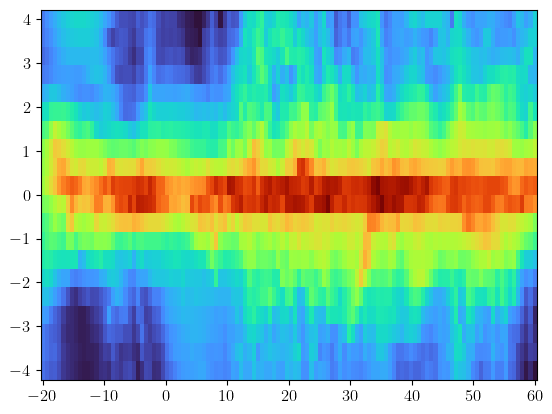

In [16]:
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
plt.rcParams[ "text.usetex" ] = True
plt.pcolormesh( L, B, Sigma, norm=LogNorm())# 1e19, 1e23 ) )

(array([1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 4.000e+00, 1.500e+01,
        3.780e+02, 1.892e+03, 1.050e+02, 4.000e+00]),
 array([-1390.91060764, -1208.16373648, -1025.41686533,  -842.66999418,
         -659.92312303,  -477.17625188,  -294.42938073,  -111.68250958,
           71.06436157,   253.81123272,   436.55810387]),
 <BarContainer object of 10 artists>)

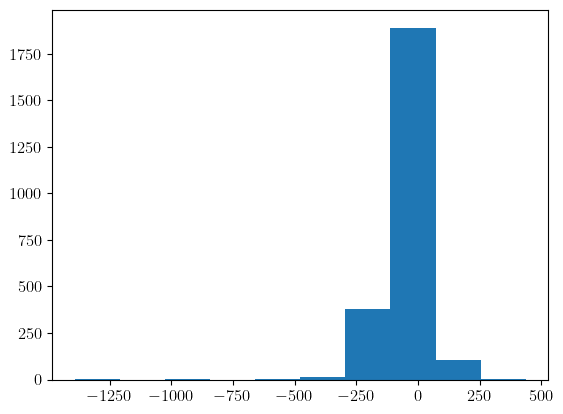

In [17]:
plt.hist(v_flat)

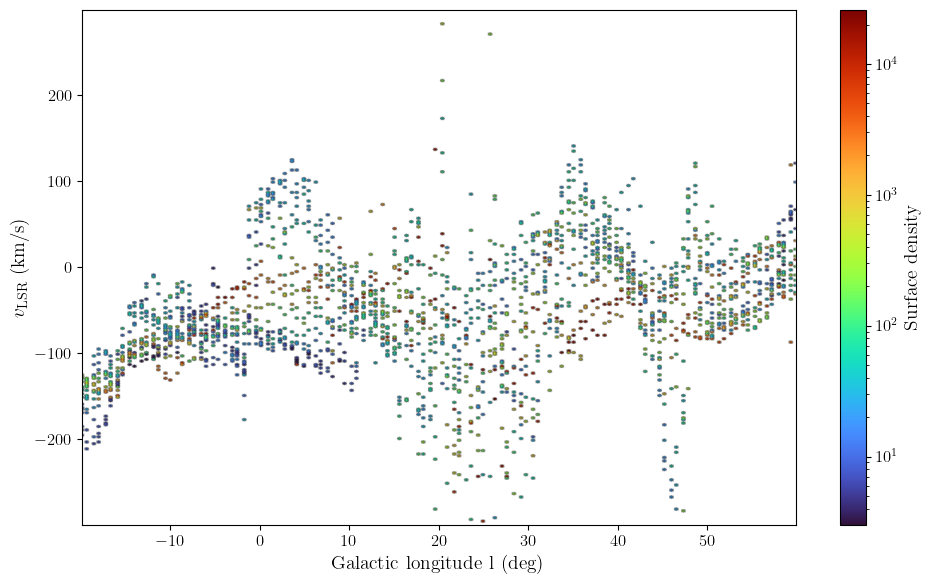

In [15]:
ledge = np.linspace(-20, 60, 301)   # 300 bins
vedge = np.linspace(-300, 300, 301) # 300 bins
l_flat     = L.ravel()        # shape (Nl*Nb,)
v_flat     = Vlos.ravel()     # shape (Nl*Nb,)
sigma_flat = Sigma.ravel()    # weights


lvd, _, _ = np.histogram2d(
    l_flat, v_flat,
    bins=[ledge, vedge],
    weights=sigma_flat
)
Lv, Vv = np.meshgrid(
    (ledge[:-1] + ledge[1:]) / 2,
    (vedge[:-1] + vedge[1:]) / 2,
    indexing='ij'
)

fig, ax = plt.subplots(figsize=(10, 6))
s = ax.pcolormesh(Lv, Vv, lvd, cmap='turbo', shading="gouraud",
                  norm=LogNorm(vmin=lvd[lvd>0].min(), vmax=lvd.max()),rasterized=True)
plt.colorbar(s, label='Surface density')
#ax.set_xlim(90, -90)   # convention: l decreases to the right
#ax.set_ylim(-300, 300)
ax.set_xlabel('Galactic longitude l (deg)')
ax.set_ylabel(r'$v_\mathrm{LSR}$ (km/s)')
plt.tight_layout()
plt.show()

/tmp/ipykernel_1821871/1202182380.py:1: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  s = plt.pcolormesh( L, Vlos, Sigma, cmap='turbo', norm=LogNorm() )# 1e19, 1e23 ) )


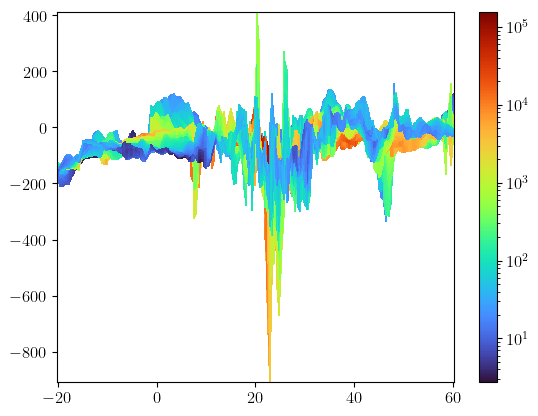

In [41]:
vbins = np.linspace( -300, 300, len( lrange ) )
vrange = np.append( vbins - np.diff( vbins )[ 0 ] / 2, vbins[ -1 ] + np.diff( vbins )[ 0 ] ) 
print( vbins, vrange )

[-300.         -297.48953975 -294.9790795  -292.46861925 -289.958159
 -287.44769874 -284.93723849 -282.42677824 -279.91631799 -277.40585774
 -274.89539749 -272.38493724 -269.87447699 -267.36401674 -264.85355649
 -262.34309623 -259.83263598 -257.32217573 -254.81171548 -252.30125523
 -249.79079498 -247.28033473 -244.76987448 -242.25941423 -239.74895397
 -237.23849372 -234.72803347 -232.21757322 -229.70711297 -227.19665272
 -224.68619247 -222.17573222 -219.66527197 -217.15481172 -214.64435146
 -212.13389121 -209.62343096 -207.11297071 -204.60251046 -202.09205021
 -199.58158996 -197.07112971 -194.56066946 -192.05020921 -189.53974895
 -187.0292887  -184.51882845 -182.0083682  -179.49790795 -176.9874477
 -174.47698745 -171.9665272  -169.45606695 -166.94560669 -164.43514644
 -161.92468619 -159.41422594 -156.90376569 -154.39330544 -151.88284519
 -149.37238494 -146.86192469 -144.35146444 -141.84100418 -139.33054393
 -136.82008368 -134.30962343 -131.79916318 -129.28870293 -126.77824268
 -124.267

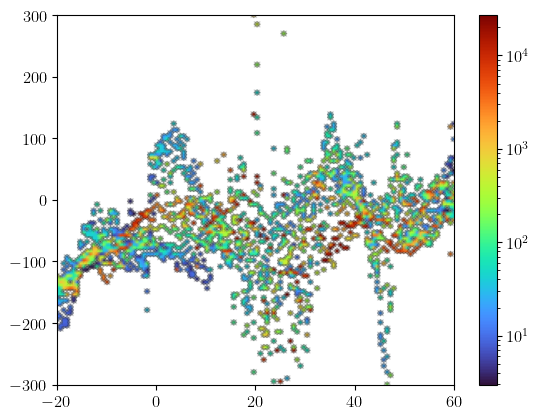

In [19]:
lvd = []
vrange = np.linspace( -300, 300, len( lrange ) )
vbins = np.append( vrange - np.diff( vrange )[ 0 ] / 2, vrange[ -1 ] + np.diff( vrange )[ 0 ] ) 
for il, l in enumerate( L ):
    lvd.append( np.histogram( Vlos[ il ], bins=vbins, weights=Sigma[ il ] )[ 0 ] )
Lv, Vv = np.meshgrid( lrange, vrange, indexing='ij' )
s = plt.pcolormesh( Lv, Vv, np.array( lvd ), cmap='turbo', norm=LogNorm(), shading="gouraud" )# 1e19, 1e23 ) )
plt.colorbar( s )

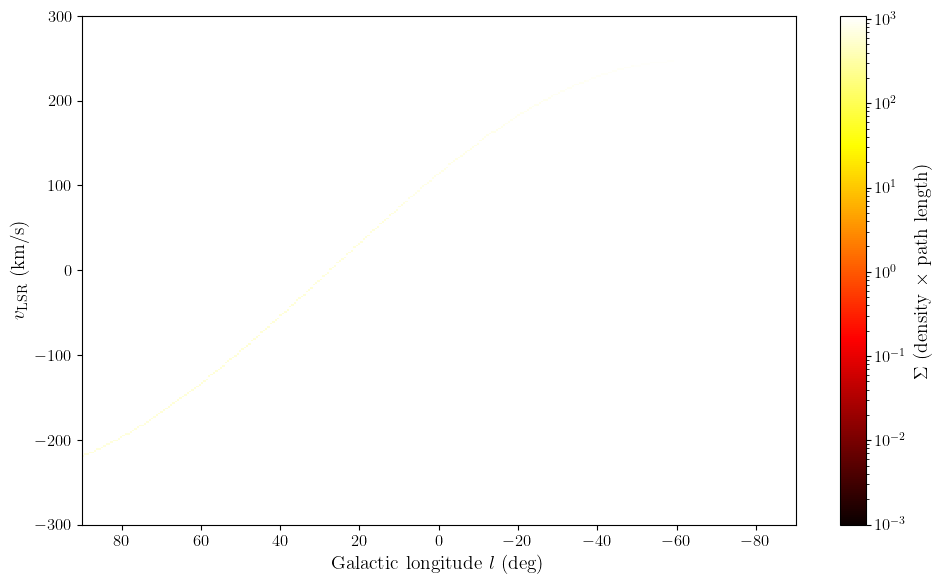

In [44]:
# --- Parameters (adjust to match your simulation units) ---
Rsun    = 8.15       # kpc
v_lsr   = 236.0      # km/s, circular speed at Sun
lsr_u   = 10.6       # km/s, solar peculiar motion components
lsr_v   = 10.7
lsr_w   = 7.6
bar_angle = 28.0     # deg
omegab    = 37.5     # km/s/kpc, bar pattern speed

# yt velocity unit conversion: if yt gives velocities in cm/s, divide by 1e5 to get km/s
VEL_UNIT = 1e5       # cm/s per km/s — set to 1.0 if yt already returns km/s

# --- Sun position ---
# You must compute phi_sun from the simulation time (as in the reference code)
# or set it explicitly.  Here we use the reference formula:
#   rot_angle = time * unitT * omegab * 1.02269032  (radians → degrees)
#   phisun = rot_angle + (180 - bar_angle) - 180
# For a static test, just set:
phisun = 25.0        # degrees — replace with your time-evolved value

xsun = Rsun * np.cos(np.radians(phisun))
ysun = Rsun * np.sin(np.radians(phisun))
zsun = 0.025         # kpc

omega_sun = (v_lsr + lsr_v) / Rsun   # km/s/kpc

# Solar velocity in simulation frame (same sign convention as reference)
velxsun =  -omega_sun * ysun - lsr_u * np.cos(np.radians(phisun))
velysun  =   omega_sun * xsun - lsr_u * np.sin(np.radians(phisun))
velzsun  =   lsr_w

x1 = np.array([xsun, ysun, zsun])    # kpc

# --- LVD grid ---
lrange = np.linspace(-90, 90, 300)
vrange = np.linspace(-300, 300, 300)
Lray   = 20.0    # kpc, max ray length

# Accumulate raw (l, v, weight) tuples
lv_l_all = []
lv_v_all = []
lv_w_all = []

for il, l in enumerate(lrange):
    print(f"{il}/{len(lrange)}", end="\r")

    for ib, b in enumerate([0.0]):   # integrate over b if desired
        # --- Ray direction in Galactic coordinates ---
        l_rad = np.radians(l)
        b_rad = np.radians(b)

        # Direction unit vector (standard Galactic convention)
        e_x =  np.cos(b_rad) * np.cos(l_rad)
        e_y =  np.cos(b_rad) * np.sin(l_rad)
        e_z =  np.sin(b_rad)
        elos = np.array([e_x, e_y, e_z])   # already unit length

        # Ray endpoint
        x2 = x1 + Lray * elos

        # --- Cast yt ray ---
        ray = dyt.ray(tuple(x1), tuple(x2))
        sort = np.argsort(ray["t"])

        # Cell positions along ray (kpc)
        # yt "t" is the fractional parameter; 0 = x1, 1 = x2
        dl_frac = ray["dts"][sort]          # fraction of ray length per cell
        dl_kpc  = dl_frac * Lray            # physical length in kpc

        density = np.array(ray["gas", "density"][sort])   # g/cm³ (or code units)

        # --- Velocities: convert to km/s ---
        vx = np.array(ray["gas", "velocity_x"][sort]) / VEL_UNIT
        vy = np.array(ray["gas", "velocity_y"][sort]) / VEL_UNIT
        vz = np.array(ray["gas", "velocity_z"][sort]) / VEL_UNIT

        # --- Project each cell's velocity onto LOS unit vector ---
        # elos = [e_x, e_y, e_z] already normalised
        v_grid_los = vx * e_x + vy * e_y + vz * e_z   # km/s, shape (Ncells,)

        # --- Project Sun's velocity onto same LOS vector ---
        v_sun_los  = velxsun * e_x + velysun * e_y + velzsun * e_z  # scalar km/s

        # --- LSR-frame line-of-sight velocity ---
        v_los = v_grid_los - v_sun_los      # shape (Ncells,)

        # --- Weight = density * dl (column density per cell) ---
        weight = density * dl_kpc           # shape (Ncells,)

        # Accumulate per-cell contributions — do NOT average here
        lv_l_all.append(np.full(len(v_los), l))
        lv_v_all.append(v_los)
        lv_w_all.append(weight)

# --- Build LVD ---
lv_l = np.concatenate(lv_l_all)
lv_v = np.concatenate(lv_v_all)
lv_w = np.concatenate(lv_w_all)

ledge = np.linspace(-90,  90,  len(lrange) + 1)
vedge = np.linspace(-300, 300, len(vrange) + 1)

lvd, _, _ = np.histogram2d(lv_l, lv_v, bins=[ledge, vedge], weights=lv_w)

# --- Plot ---
Lv, Vv = np.meshgrid(
    (ledge[:-1] + ledge[1:]) / 2,
    (vedge[:-1] + vedge[1:]) / 2,
    indexing='ij'
)
fig, ax = plt.subplots(figsize=(10, 6))
s = ax.pcolormesh(Lv, Vv, lvd, cmap='hot', norm=LogNorm(vmin=1e-3, vmax=lvd.max()))
plt.colorbar(s, ax=ax, label=r'$\Sigma$ (density $\times$ path length)')
ax.set_xlabel('Galactic longitude $l$ (deg)')
ax.set_ylabel('$v_\mathrm{LSR}$ (km/s)')
ax.set_xlim(90, -90)
ax.set_ylim(-300, 300)
plt.tight_layout()
plt.show()

In [ ]:
ray["gas","velocity_x"]

unyt_array([ -39.46627256,  -74.54501187,  -99.19537513, -105.71708327,
       -120.86498588], 'code_velocity')

: 

M = [[ 0.42261826  0.90630779  0.        ]
 [ 0.90630779 -0.42261826  0.        ]
 [ 0.          0.          1.        ]]


yt : [INFO     ] 2026-06-25 19:06:55,267 Projection completed
yt : [INFO     ] 2026-06-25 19:06:55,271 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-25 19:06:55,272 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-25 19:06:55,275 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-25 19:06:55,276 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-06-25 19:06:55,277 Making a fixed resolution buffer of (('gas', 'velocity_x_rot')) 800 by 800



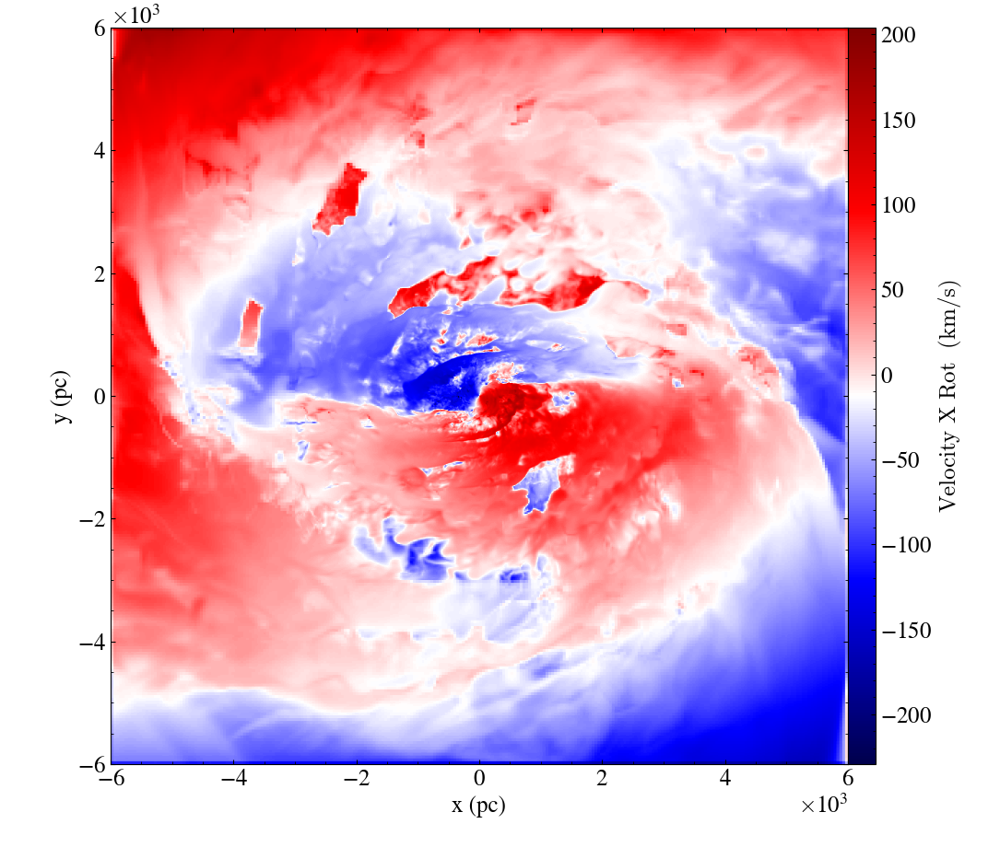

In [78]:
from yt.utilities.math_utils import get_rotation_matrix

# --- Define the transformation ---
theta = -np.radians(65)
R = get_rotation_matrix(theta, [0, 0, 1])
Refl = np.array([[1, 0, 0], [0, -1, 0], [0, 0, 1]])
M = Refl @ R

# Precompute the rows of M we'll need
# velocity_x_rot = M[0,:] . [vx, vy, vz], etc.
print("M =", M)

def make_velocity_field(component):
    def _transformed_velocity(field, data):
        vx = data["gas", "velocity_x"].to("km/s")
        vy = data["gas", "velocity_y"].to("km/s")
        vz = data["gas", "velocity_z"].to("km/s")
        # Apply one row of M directly — no matmul, no stacking
        result = M[component, 0] * vx + M[component, 1] * vy + M[component, 2] * vz
        return result
    return _transformed_velocity

for i, name in enumerate(["velocity_x_rot", "velocity_y_rot", "velocity_z_rot"]):
    dyt.add_field(
        ("gas", name),
        function=make_velocity_field(i),
        units="km/s",
        sampling_type="cell",
        force_override=True,
    )

# --- Plot ---
prj = yt.ProjectionPlot(dyt, "z", ("gas", "velocity_x_rot"), weight_field=("gas", "density"))
prj.set_axes_unit('pc')
prj.set_log("velocity_x_rot", False)
prj.set_xlabel('x (pc)')
prj.set_ylabel('y (pc)')
prj.set_cmap(("gas", "velocity_x_rot"), "seismic")
prj.show()

x0 not found


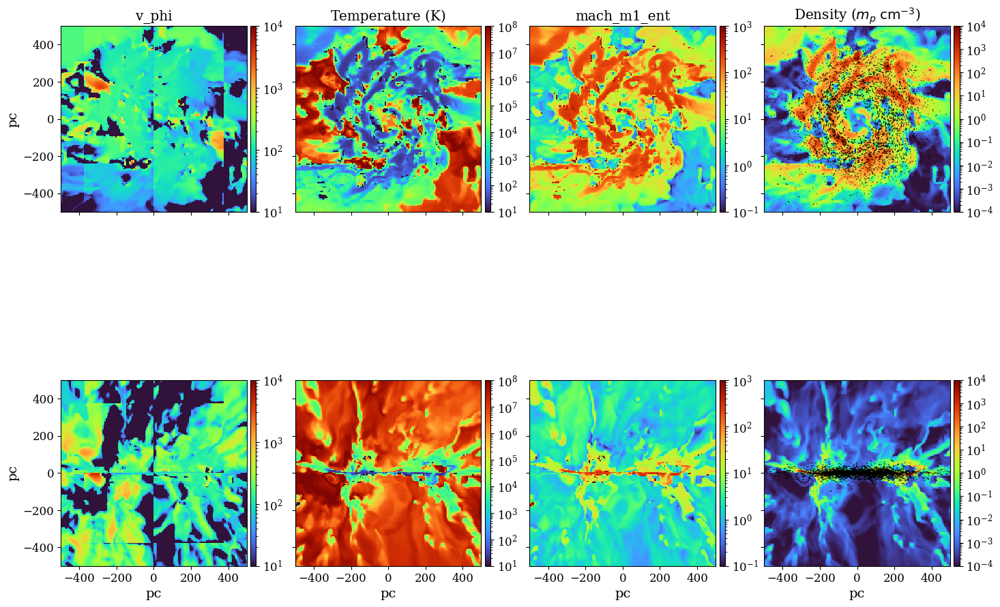

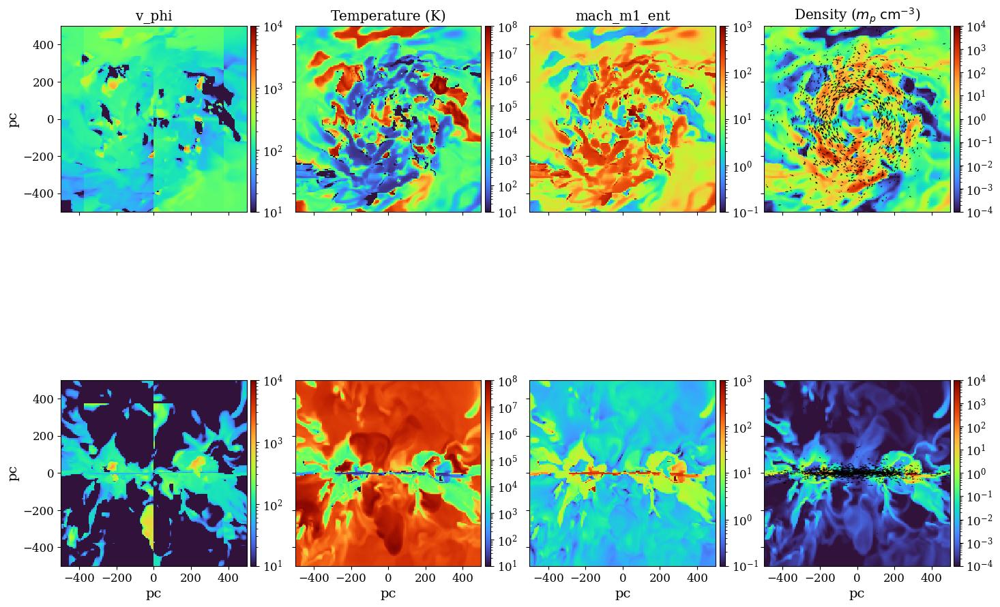

In [46]:
from enroll_virial import enroll_virial
enroll_mach_ent( d )
enroll_mach_ent( d2 )
enroll_vphi( d )
enroll_vphi( d2 )
fig2 = f_plot_grid( d,  figsize=( 17, 13.5 )
                    ,xlims = [ ( -500, 500 ), ( -500, 500 ) ] 
                    ,ylims = [ ( -500, 500 ), ( -500, 500 ) ]
                    #,log   = [ True, True, True, False ]
                    #, locs  = [ [ 90, 90, 90, 90 ], [ 10, 10, 10, 10 ] ]
                    , locs  = [ [ 10, 10, 10, 10 ], [ 10, 10, 10, 10 ] ]
                    #,axes  = 2,
                    #,z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    ,z0s   = [ units.v0/1e5, 1, 1, 1 ]
                    #,log   = [ True, True, False, True ]
                    ,flds  = [ 'v_phi', 'T_ent', 'mach_m1_ent', 'rho' ]
                    ,zlims = [ ( 1e1, 1e4 ), ( 1e1, 1e8 ), ( 1e-1, 1e3 ), ( 1e-4, 1e4 ) ]
                    #,part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )
fig2 = f_plot_grid( d2,  figsize=( 17, 13.5 )
                    ,xlims = [ ( -500, 500 ), ( -500, 500 ) ] 
                    ,ylims = [ ( -500, 500 ), ( -500, 500 ) ]
                    #,log   = [ True, True, True, False ]
                    , locs  = [ [ 10, 10, 10, 10 ], [ 10, 10, 10, 10 ] ]
                    #,axes  = 2,
                    #,z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    ,z0s   = [ units.v0/1e5, 1, 1, 1 ]
                    #,log   = [ True, True, False, True ]
                    ,flds  = [ 'v_phi', 'T_ent', 'mach_m1_ent', 'rho' ]
                    ,zlims = [ ( 1e1, 1e4 ), ( 1e1, 1e8 ), ( 1e-1, 1e3 ), ( 1e-4, 1e4 ) ]
                    #,part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )

In [47]:
from blk_func import *
QUmass = []
SBmass = []
QUt    = []
SBt    = []
for out in np.arange( 30, 66, 1 ):
    d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_b10_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
    d2  = get_last_dd( f'../../cmz/cmz_test/outputs/cmz_fid4_b60_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
    SBt.append( d.globals['time'] )
    QUt.append( d2.globals['time'] )
    QUm = 0
    SBm = 0
    for b, bd in d.data.items( ):
        if "block" not in b:
            continue
        SBm += bf_hyd_cmzmass( b, bd, R_out = 170, Z_out = 140 )
        QUm += bf_hyd_cmzmass( b, d2.data[ b ], R_out = 170, Z_out = 140 )
    QUmass.append( QUm )
    SBmass.append( SBm )
    #SBflux.append( cylinder_mass_flux( d, 50, 140 ) )
    #QUflux.append( cylinder_mass_flux( d2,50, 140 ) )
    del d
    del d2

file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00030.bin; time = 150
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00030.bin; time = 150
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00031.bin; time = 155
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00031.bin; time = 155
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00032.bin; time = 160
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00032.bin; time = 160
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00033.bin; time = 165
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00033.bin; time = 165
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00034.bin; time = 170
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00034.bin; time = 170
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00035.bin; time = 175
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00035.bin; time = 175
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00036.bin; time = 180
file: ../../cmz/cmz_test/outputs/cmz_fid4_b60_00036.bin; time = 180
file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_00

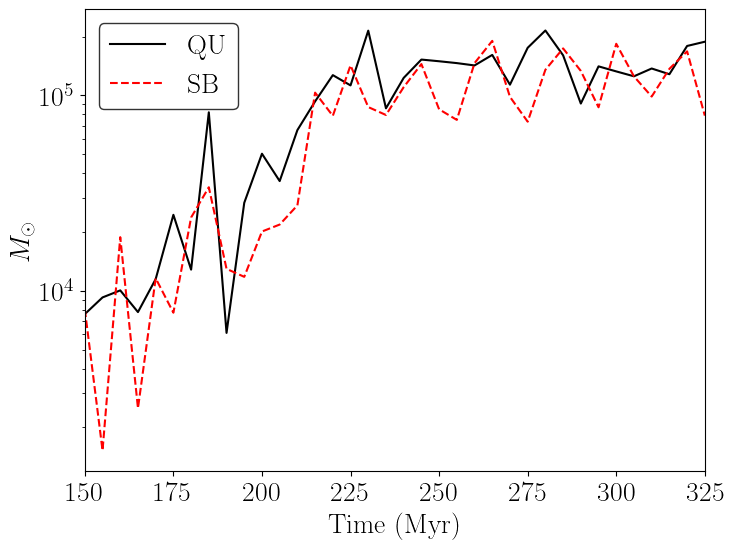

In [64]:
from matplotlib import rc
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
f,ax = plt.subplots( 1, 1, figsize=(8,6) )
plt.rcParams[ "text.usetex" ] = True
plt.rcParams[ "font.size" ] = 20
ax.plot( QUt, np.array( QUmass ) * units.m0/units.modot, "-k", label="QU" )
ax.plot( SBt, np.array( SBmass ) * units.m0/units.modot, "--r", label="SB" )
ax.set_xlabel( "Time (Myr)", fontsize=20 )
ax.set_yscale('log')
ax.set_xlim([150,325])
ax.set_ylabel(r"$M_\odot$", fontsize=20 )
ax.legend(fontsize=20)
plt.savefig( "../../cmz/paper_plots/innerdiscmass.png",bbox_inches='tight' )

file: ../../cmz/cmz_test/outputs/cmz_fid4_b10_nofb_00065.bin; time = 325.003
file: ../../cmz/cmz_test/outputs/cmz_fid4_iso_00065.bin; time = 325.001


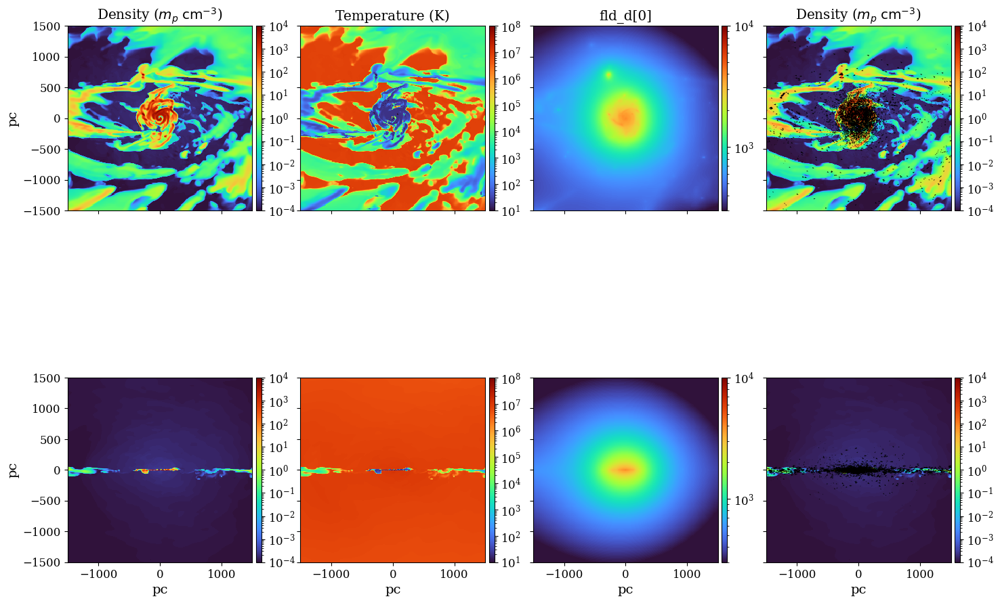

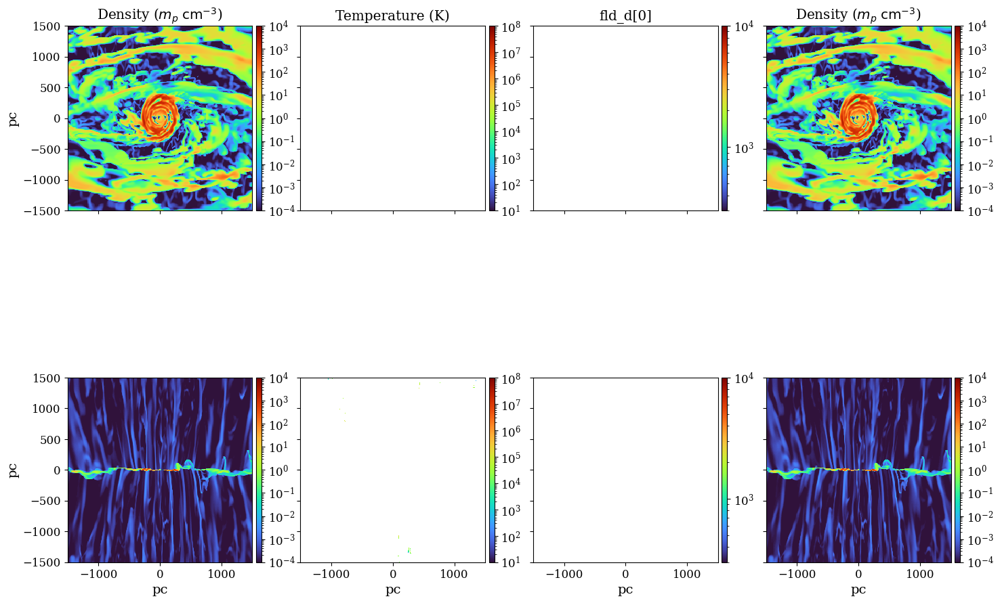

In [38]:
out = 65
d  = get_last_dd(  f'../../cmz/cmz_test/outputs/cmz_fid4_b10_nofb_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
d2  = get_last_dd( f'../../cmz/cmz_test/outputs/cmz_fid4_iso_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data );

fig2 = f_plot_grid( d,  figsize=( 17, 13.5 )
                    ,xlims = [ ( -1500, 1500 ), ( -1500, 1500 ) ] 
                    ,ylims = [ ( -1500, 1500 ), ( -1500, 1500 ) ]
                    #,log   = [ True, True, True, False ]
                    #, locs  = [ [ 90, 90, 90, 90 ], [ 10, 10, 10, 10 ] ]
                    #,locs  = [ [ 1e-2, 1e-2, 1e-2, 2 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #,axes  = 2,
                    #,z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    ,z0s   = [ 1, 1, -1, 1 ]
                    #,log   = [ True, True, False, True ]
                    ,flds  = [ 'rho', 'T_ent', 'fld_d[0]', 'rho' ]
                    ,zlims = [ ( 1e-4, 1e4 ), ( 1e1, 1e8 ), ( 3e2, 1e4 ), ( 1e-4, 1e4 ) ]
                    #,part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )
fig2 = f_plot_grid( d2,  figsize=( 17, 13.5 )
                    ,xlims = [ ( -1500, 1500 ), ( -1500, 1500 ) ] 
                    ,ylims = [ ( -1500, 1500 ), ( -1500, 1500 ) ]
                    #,log   = [ True, True, True, False ]
                    #, locs  = [ [ 90, 90, 90, 90 ], [ 10, 10, 10, 10 ] ]
                    #,locs  = [ [ 1e-2, 1e-2, 1e-2, 2 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #,axes  = 2,
                    #,z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    ,z0s   = [ 1, 1, -1, 1 ]
                    #,log   = [ True, True, False, True ]
                    ,flds  = [ 'rho', 'T_ent', 'fld_d[0]', 'rho' ]
                    ,zlims = [ ( 1e-4, 1e4 ), ( 1e1, 1e8 ), ( 3e2, 1e4 ), ( 1e-4, 1e4 ) ]
                    #,part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )

In [ ]:
cool_file="../outputs/therm_tables/cooling_table.dat"
config = configparser.ConfigParser(inline_comment_prefixes="#")
config.read( cool_file )
lg_z = np.array( config.get( "cooling", "lg_z" ).split( " " ), dtype=float )
lg_e = np.array( config.get( "cooling", "lg_e" ).split( " " ), dtype=float )
lg_rho = np.array( config.get( "cooling", "lg_rho" ).split( " " ), dtype=float )
lg_mu_cgs   = np.array( config.get( "cooling", "lg_mu_cgs" ).split( " " ), dtype=float )
lg_lam = np.array( config.get( "cooling", "lg_lam" ).split( " " ), dtype=float )
lg_gam = np.array( config.get( "cooling", "lg_gam" ).split( " " ), dtype=float )
mu   = 10**lg_mu_cgs / units.mp
    

In [9]:
10**lg_rho[ 11 ]/mp

0.8912565088701621

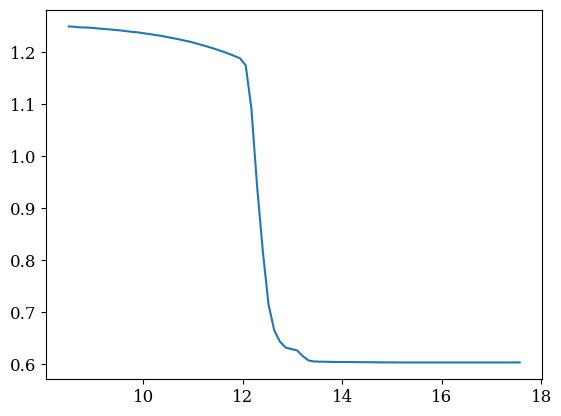

In [4]:
plt.plot( lg_e, mu )

In [15]:
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
plt.rcParams[ "text.usetex" ] = True
metind = 1
rhoind = 11
idx = metind * ( len( lg_e ) * len( lg_rho ) ) + rhoind * len( lg_e )
f,ax = plt.subplots()
ax.plot( 10**lg_e, 10**lg_lam[ idx:idx + len(lg_e)])
ax.plot( 10**lg_e, 10**lg_gam[ idx:idx + len(lg_e)])
ax.set_xscale( 'log' )
ax.set_yscale( 'log' )
ax2 = ax.twinx( )

ax2.plot( 10**lg_e, mu )
ax.set_xlabel( r"$\epsilon_g \; (\mathrm{cm}^2 \; \mathrm{s}^{-2})$" )

NameError: name 'rc' is not defined

In [5]:
d.load_particles( )
filter = par_pos_cut( d, 500, [ -140, 140 ], coord='cyl' )
np.sum( d.data['particle_sfr'][filter] ) * m0 / modot / ( t0 / yr )

0.20202257857223435

(0.001, 10.0)

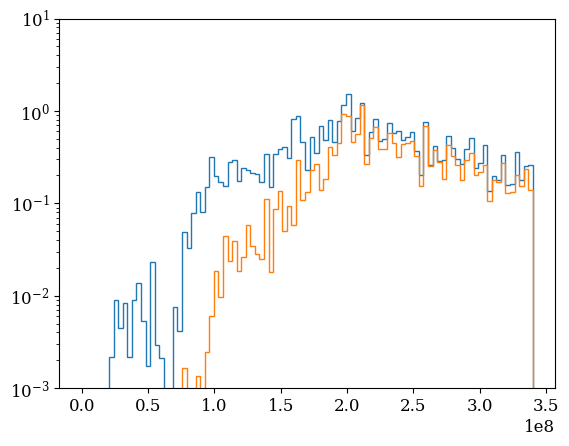

In [24]:
all_ages = d.data['particle_tcreatemrg'] * 1e6
cmz_ages = d.data['particle_tcreatemrg'][filter] * 1e6
mstar    = d.data['particle_m']
bins = np.linspace( 0, d.globals['time']*1e6, 100 )
conv = m0 / modot / np.diff( bins )[ 0 ]
plt.hist( all_ages, weights=mstar*conv, bins=bins, histtype='step', fill=False, label='All' )
plt.hist( cmz_ages, weights=mstar[ filter ]*conv, bins=bins, histtype='step', fill=False, label='CMZ' )
plt.yscale( 'log' )
plt.ylim( [1e-3, 1e1] )

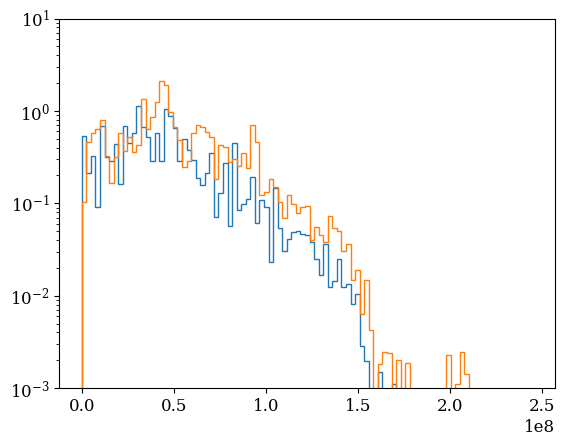

In [6]:
for dd in [ d, d2 ]:
    filter = par_pos_cut( dd, 500, [ -140, 140 ], coord='cyl' )
    all_ages = dd.data['particle_age'] * 1e6
    cmz_ages = dd.data['particle_age'][filter] * 1e6
    mstar    = dd.data['particle_mstar']
    bins = np.linspace( 0, dd.globals['time']*1e6, 100 )
    conv = m0 / modot / np.diff( bins )[ 0 ]
    #plt.hist( all_ages, weights=mstar*conv, bins=bins, histtype='step', fill=False, label='All' )
    plt.hist( cmz_ages, weights=mstar[ filter ]*conv, bins=bins, histtype='step', fill=False, label='CMZ' )
    plt.yscale( 'log' )
    plt.ylim( [1e-3, 1e1] )

(array([2.07997485e+03, 4.00564062e+04, 8.17421953e+04, 5.93238828e+04,
        7.69664800e+06, 6.36261350e+06, 6.48454050e+06, 3.38547240e+07,
        2.85410580e+07, 7.84697440e+07, 1.23780832e+08, 1.05474792e+08,
        7.28640560e+07, 1.69222416e+08, 9.70340160e+07, 6.09055920e+07,
        5.41966840e+07, 4.67162600e+07, 3.21520200e+07, 4.18565880e+07,
        4.42384120e+07, 2.79706140e+07, 8.91367800e+06, 1.93458140e+07,
        2.80032260e+07, 8.73497000e+06, 3.56377900e+06, 4.39129700e+06,
        1.19641770e+07, 7.69974250e+05]),
 array([ 36.85723495,  52.24963379,  67.64203644,  83.03443146,
         98.42683411, 113.81922913, 129.21162415, 144.60403442,
        159.99642944, 175.38882446, 190.78121948, 206.17362976,
        221.56602478, 236.9584198 , 252.35083008, 267.7432251 ,
        283.13562012, 298.52801514, 313.92041016, 329.31280518,
        344.70523071, 360.09762573, 375.49002075, 390.88241577,
        406.27481079, 421.66720581, 437.05960083, 452.45202637,
      

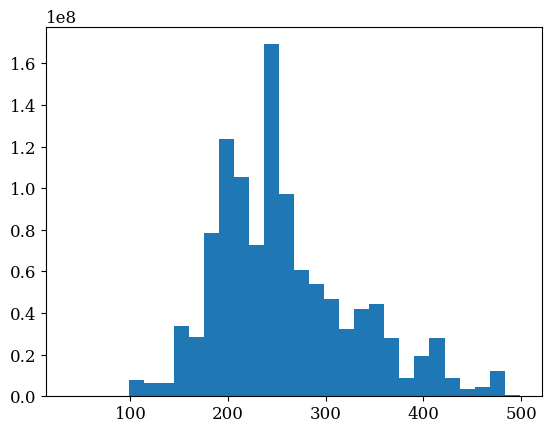

In [8]:
filter = par_pos_cut( d, 500, [ -140, 140 ], coord='cyl' )
part_Rcyl = np.sqrt( np.sum( d.data['particle_x'][filter][ :,:2 ]**2, axis=1 ) )
cmz_mstar    = d.data['particle_mstar'][ filter ]
plt.hist( part_Rcyl, weights=cmz_mstar, bins=30 )
#plt.hist( part_Rcyl, weights=cmz_ages, bins=50 )

/tmp/ipykernel_261256/2792357285.py:19: RuntimeWarning: Degrees of freedom <= 0 for slice
  errs.append( np.sqrt(np.cov( d.data['particle_age'][filt], aweights=d.data['particle_mstar'][filt] ) ) )


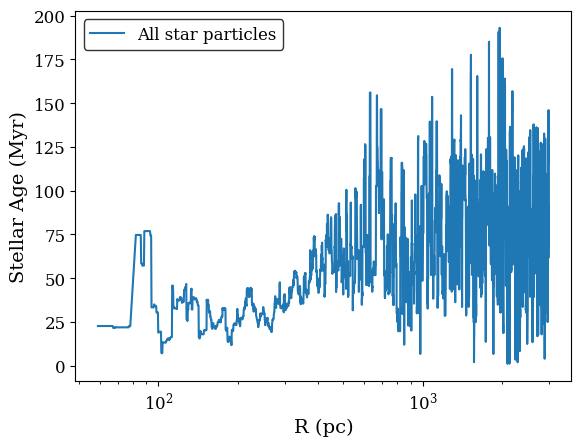

In [11]:
rbins = np.linspace( 0, 3000, 10000 )#10**np.linspace(0, 3.5, 50)#np.linspace( 0, 3000, 1000 )
#drbins = 
ages = [ ]

agesfilt = [ ]
rcyl = [ ]
rcylfilt = [ ]
errs = [ ]
agecut = 20
tcreatecut = 30
for rin, rout in zip( rbins, rbins + 10 ):#zip( rbins[ :-1 ], rbins[ 1: ] ):
    
    filt = par_pos_cut( d, [ rin, rout ], [ -140, 140 ], coord='cyl' )
    #filt2 = ( filt ) & ( d.data[ 'particle_tcreate' ] > d.globals['time'] - tcreatecut )
    filt2 = ( filt ) & ( d.data[ 'particle_age' ] < agecut )
    if len( d.data['particle_mstar'][filt] ) == 0:
        continue
    ages.append( np.average( d.data['particle_age'][filt], weights=d.data['particle_mstar'][filt] ) )
    errs.append( np.sqrt(np.cov( d.data['particle_age'][filt], aweights=d.data['particle_mstar'][filt] ) ) )
    rcyl.append( rin / 2 + rout / 2 )
    if len( d.data['particle_mstar'][filt2] ) == 0:
        continue
    agesfilt.append( np.average( d.data['particle_age'][filt2], weights=d.data['particle_mstar'][filt2] ) )
    rcylfilt.append( rin / 2 + rout / 2 )
    
plt.plot( rcyl, ages, label = "All star particles" )
#plt.errorbar( rcyl, ages, errs, label="All Star Particles")
#plt.plot( rcylfilt, agesfilt, label=f"Age < {agecut} Myr" )
plt.xlabel( "R (pc)" )
plt.ylabel( "Stellar Age (Myr)" )
plt.legend( )
#plt.yscale('log')
plt.xscale('log')
#plt.axvline( x=350 )

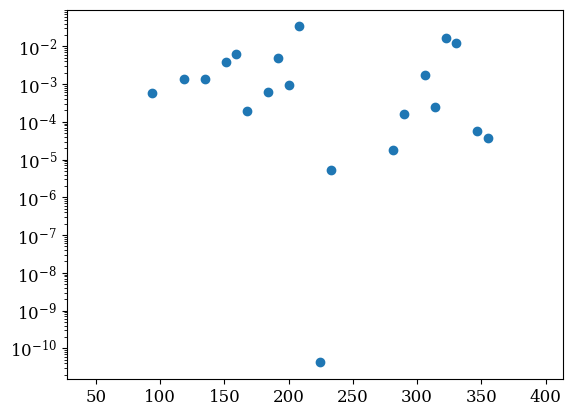

In [43]:
rbins = np.linspace( 0, 400, 50 )
sfr = [ ]
rcyl = [ ]
for rin, rout in zip( rbins[ :-1 ], rbins[ 1: ] ):
    filt = par_pos_cut( d, [ rin, rout ], [ -140, 140 ], coord='cyl' )
    if len( d.data['particle_mstar'][filt] ) == 0:
        continue
    sfr.append( np.sum( d.data['particle_sfr'][ filt ] ) * (  m0 / modot ) / ( t0 / yr ) )
    rcyl.append( rin / 2 + rout / 2 )
plt.scatter( rcyl, sfr )
plt.yscale( 'log' )

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([ 43.28705215,  47.8236137 ,  52.36017525,  56.89673679,
         61.43329834,  65.96985989,  70.50642143,  75.04298298,
         79.57954453,  84.11610607,  88.65266762,  93.18922916,
         97.72579071, 102.26235226, 106.7989138 , 111.33547535,
        115.8720369 , 120.40859844, 124.94515999, 129.48172153,
        134.01828308, 138.55484463, 143.09140617, 147.62796772,
        152.16452927, 156.70109081, 161.23765236, 165.77421391,
        170.31077545, 174.847337  , 179.38389854, 183.92046009,
        188.45702164, 192.99358318, 197.53014473, 202.06670628,
        206.60326782, 211.13982937, 215.67639091, 220.21295246,
        224.74951401, 229.28607555, 233.8226371 , 238.35919865,
        242.89576019, 247.43232174, 251.9688832

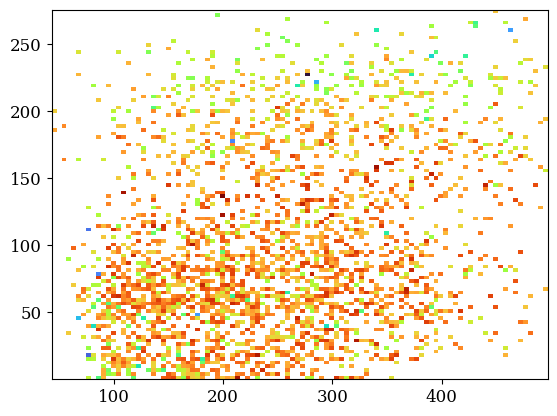

In [45]:
filter = par_pos_cut( d, 500, [ -140, 140 ], coord='cyl' ) # & ( d.data[ 'particle_age' ] < 20 )
part_Rcyl = np.sqrt( np.sum( d.data['particle_x'][filter][ :,:2 ]**2, axis=1 ) )
plt.hist2d( part_Rcyl, d.data['particle_age'][filter], bins=100, weights=d.data['particle_mstar'][filter], norm=mpl.colors.LogNorm()  )

In [ ]:
from yt.data_objects.level_sets.api import *

ds = dyt.disk( [ 0,0,0 ], [ 0, 0, 1 ], ( 12, "kpc" ), ( 500, "pc" ) )
master_clump = Clump( ds, ( "gas", "density" ) )

file: ../cmz/cmz_test/outputs/cmz_fb2_test_00100.bin; time = 100


/tmp/ipykernel_25300/2552060215.py:12: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.yscale( 'log' )


file: ../cmz/cmz_test/outputs/cmz_fb2_test_00125.bin; time = 125
file: ../cmz/cmz_test/outputs/cmz_fb2_test_00150.bin; time = 150


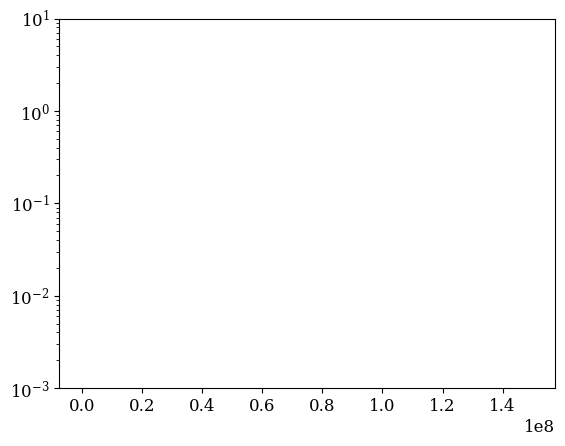

In [ ]:
for ii in [ 100, 125, 150 ]:
    d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb2_test_{fstring( ii )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
    d.load_particles( )
    filter = par_pos_cut( d, 500, [ -140, 140 ], coord='cyl' )
    all_ages = d.data['particle_age'] * 1e6
    cmz_ages = d.data['particle_age'][filter] * 1e6
    mstar    = d.data['particle_mstar']
    bins = np.linspace( 0, d.globals['time']*1e6, 200 )
    conv = m0 / modot / np.diff( bins )[ 0 ]
    #plt.hist( all_ages, weights=mstar*conv, bins=bins, histtype='step', fill=False, label='All' )
    plt.hist( cmz_ages, weights=mstar[ filter ]*conv, bins=bins, histtype='step', fill=False, label='CMZ' )
    plt.yscale( 'log' )
    plt.ylim( [1e-3, 1e1] )

(<Figure size 500x500 with 2 Axes>,
 <Axes: xlabel='$\\rho$ ($m_p$ cm$^{-3}$)', ylabel='$T$ (K)'>)

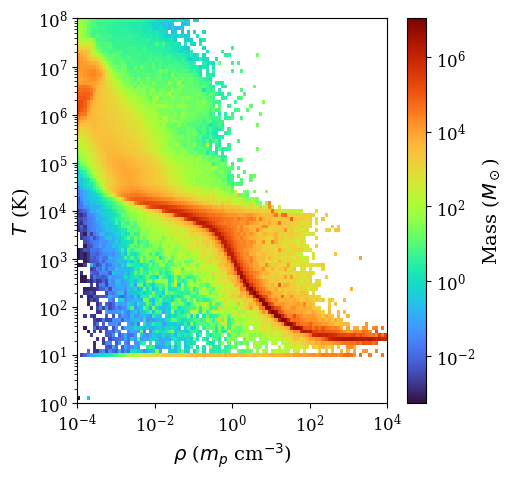

In [11]:
plt_phase( d )

/tmp/ipykernel_1045056/3285090081.py:21: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar[ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
/tmp/ipykernel_1045056/3285090081.py:25: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar[ in_cmz & recent ] )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),


2025


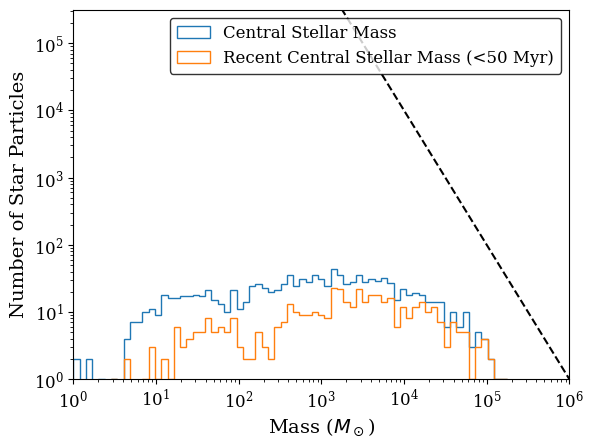

In [12]:
d_out = d
r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
R = np.sqrt( np.sum( d_out.data['particle_x'].T[ :2 ]**2, axis=0 ) )
z = d_out.data['particle_x'].T[ 2 ]
tcreate = d_out.data['particle_tcreate']
age     = d_out.data['particle_age']

in_cmz = ( R < 500 ) & ( np.abs( z ) < 140 )
recent = age < 50

mstar = d_out.data['particle_mstar']
m = d_out.data['particle_m']
sfr = d_out.data['particle_sfr']
SFdelay = d_out.data['particle_SFdelay']
RS0 = d_out.data['particle_RS0']
f,ax = plt.subplots()

xminlog = 0
xmaxlog = 6

ax.hist(( mstar[ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Central Stellar Mass')
#ax.hist(( m    [ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
#         histtype='step',fill=False,stacked=False, label='Central Total Mass')
ax.hist(( mstar[ in_cmz & recent ] )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Recent Central Stellar Mass (<50 Myr)')
#ax.hist(( m )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
#         histtype='step',fill=False,stacked=False, label='Recent Central Mass')
#ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
#         histtype='step',fill=False,stacked=False, label='Gas Mass')
ax.set_xscale('log')
ax.set_yscale('log')
x = 10**np.linspace(2,10,100)
ax.plot(x, 10**12*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**xminlog,10**xmaxlog])
ax.set_ylim([1e0,10**5.5])
ax.set_ylabel("Number of Star Particles")
ax.legend()
print( len( m ) )

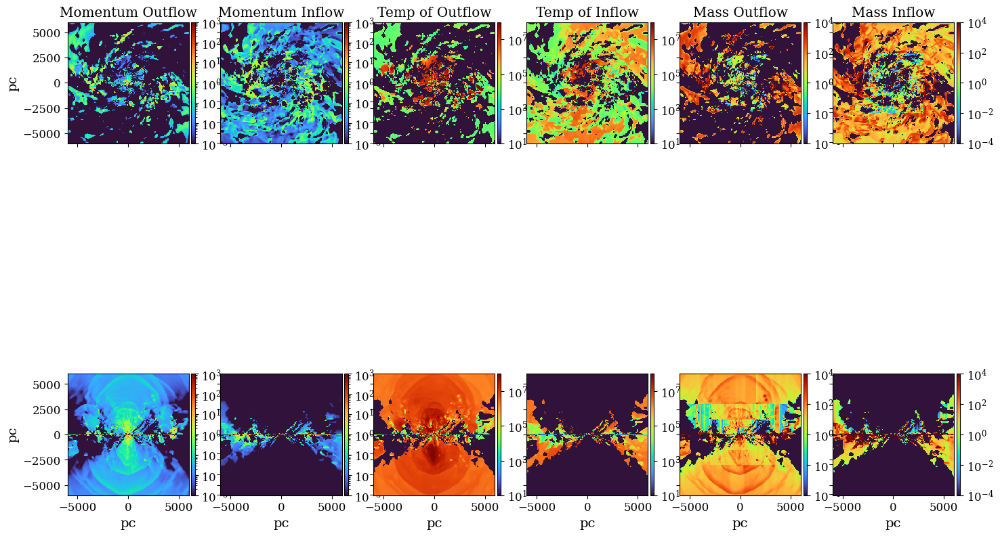

In [28]:
%reload_ext autoreload

enroll_flux( d, 'rho' )#, lambda bd : bd[ 'rho' ] * np.prod( bd[ 'dx' ], axis=0 ) )
#enroll_flux( d, 'met_fld' )
#enroll_vel( d )
#enroll_sgn( d, 'mom' )
#enroll_sgn( d, "T_ent", "sgnvel" )
#enroll_sgn( d, "met", "sgnvel" )

#R<500 z<140 definition of CMZ per 3-D CMZ battersby+2024

fig2 = f_plot_grid( d,  figsize=( 17, 13.5 ), 
                    xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], 
                    ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ],
                    #log   = [ True, True, True, True, False, False ],
                    locs  = [ [ 140, 140, 140, 140 , 140, 140 ], 
                              [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    z0s   = [ 1, -1, 1, -1, 1, -1 ],#, 1, -1 ],
                    flds  = [ 'sgnmom[2]', 'sgnmom[2]', 'sgnT_ent[2]', 'sgnT_ent[2]', 'sgnflux_rho[2]', 'sgnflux_rho[2]' ],
                    names = [ 'Momentum Outflow', "Momentum Inflow", "Temp of Outflow", "Temp of Inflow","Mass Outflow", "Mass Inflow" ],
                    zlims = [ ( 1e-3,1e3 ), ( 1e-3, 1e3 ), ( 1e1, 1e8 ), ( 1e1, 1e8 ), ( 1e-4,1e4 ), ( 1e-4, 1e4 ) ],
                    part_plot_i = [] )#( 1e-4, 1 ) ] )

In [35]:
output_data = time_evo( "../cmz/cmz_test/outputs"
                        ,"cmz_fb3_b3e3"
                        , max_out     = 30
                        , data_names  = [ "SFR" , "Mstar","Nsne", "vphi" , ( "Mflux_in", "Mflux_out" ), "Mcmz" ]
                        , data_funcs  = [ f_par_SFR , f_par_Mstar,
                                        f_par_Nsne, f_blk_cmzvel, f_blk_massflux, f_blk_cmzmass ]
                        , blk_funcs   = [ None, None, None,
                                        bf_hyd_cmzvel, bf_hyd_massflux, bf_hyd_cmzmass ]
                        , kwargs_all  = { "R_out" : 500, "Z_out": 140, "R_in" : 1000, "zflux" : 500 }
                        , unit_labels = [ r'$M_\odot \; \mathrm{Yr}^{-1}$', r'$M_\odot$',
                                         r'$N$', r'$\mathrm{km}/\mathrm{s}$', r'$M_\odot / \mathrm{Yr}', r'$M_\odot$' ]
                        #, output_data = output_data
)

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00000.bin; time = 0
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00001.bin; time = 10.0087
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00002.bin; time = 20.0027
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00003.bin; time = 30.0055
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00004.bin; time = 40.0043
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00005.bin; time = 50.0014
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00006.bin; time = 60.002
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00007.bin; time = 70.0021
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00008.bin; time = 80
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00009.bin; time = 90.0007
tcreatemrg not found
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00010.bin; time = 100
tcreatemrg not found
file: ../cmz/cmz_test/outp

In [54]:
outdata = output_data.copy( )
for i, j in outdata.items( ):
    del outdata[ i ][ "vphi" ]
    del outdata[ i ][ ('Mflux_in', 'Mflux_out') ]

KeyError: 'vphi'

In [47]:
outdata['cmz_fb3_b3e3'][ ('Mflux_in', 'Mflux_out') ]['unit'] = r'$M_\odot / \mathrm{Yr}$'


In [10]:
output_data = time_evo( "../cmz/cmz_test/outputs"
                        ,"cmz_fid4_b60"
                        , max_out     = 60
                        , data_names  = [ "SFR" , "Mstar","Nsne" , ( "Mflux_in", "Mflux_out" ), "Mcmz" ]
                        , data_funcs  = [ f_par_SFR , f_par_Mstar,
                                        f_par_Nsne, f_blk_massflux, f_blk_cmzmass ]
                        , blk_funcs   = [ None, None, None,
                                         bf_hyd_massflux, bf_hyd_cmzmass ]
                        , kwargs_all  = { "R_out" : 500, "Z_out": 140, "R_in" : 1000, "zflux" : 500 }
                        , unit_labels = [ r'$M_\odot \; \mathrm{Yr}^{-1}$', r'$M_\odot$',
                                         r'$N$', r'$M_\odot / \mathrm{Yr}', r'$M_\odot$' ]
                        #, output_data = output_data
)

file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00000.bin; time = 0
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00001.bin; time = 5.00133
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00002.bin; time = 10.0015
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00003.bin; time = 15.0019
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00004.bin; time = 20.0038
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00005.bin; time = 25.0035
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00006.bin; time = 30.0007
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00007.bin; time = 35.001
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00008.bin; time = 40.0018
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00009.bin; time = 45.0007
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00010.bin; time = 50.0033
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00011.bin; time = 55.0006
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00012.bin; time = 60.0011
file: ../cmz/cmz_test/outputs/cmz_fid4_b60_00013.bin; time = 65.0025
file: ../cmz/cmz_test/outputs/cmz_fid4_b6

((0.64362, 0.98999, 0.23356, 1.0), (0.93301, 0.81236, 0.22667, 1.0))


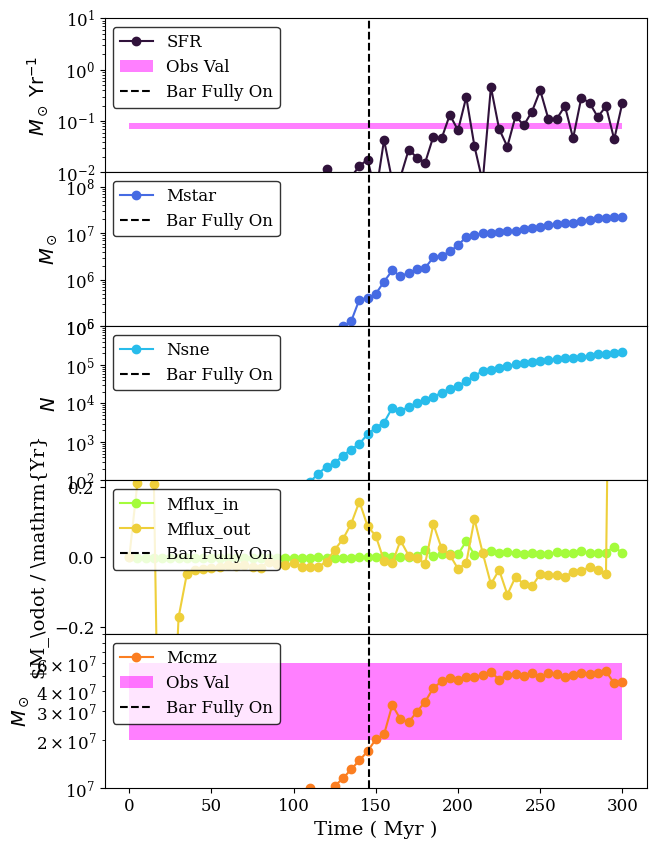

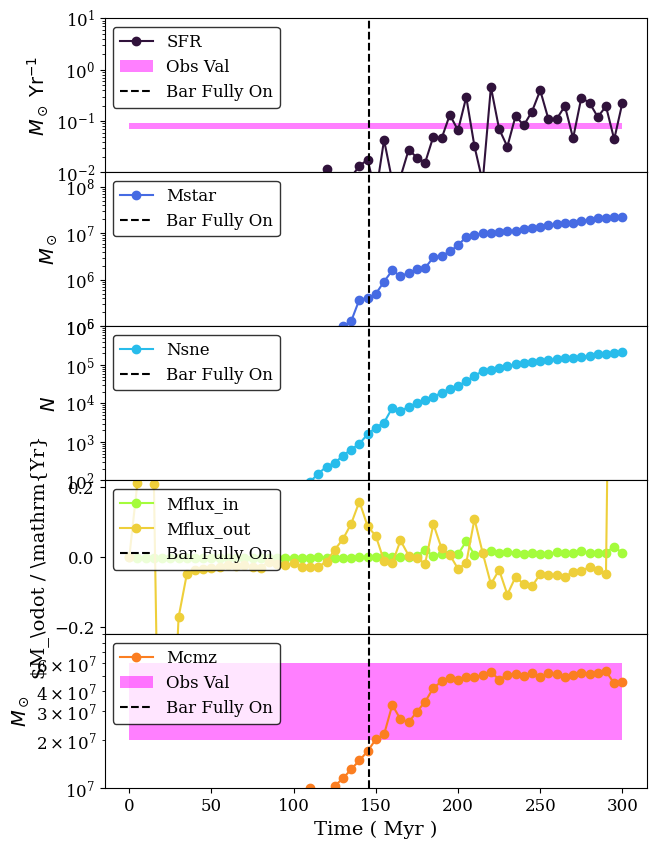

In [12]:
colors = [ plt.get_cmap( 'turbo' )( float( i ) / float( 8 ) ) 
                                       for i in range( 8 ) ]
#colors   = [ colors[0], colors[1],colors[2],colors[3], colors[4],(colors[5],colors[6]),colors[7] ]
colors   = [ colors[0], colors[1],colors[2],(colors[4],colors[5]),colors[6] ]
plt_time_evo( output_data, figsize = ( 7, 10 ),
                       titles = [ "" ],
                           ylims = [ [ 1e-2, 1e1 ], [ 1e5, 2e8 ],
                                     [ 1e2, 1e6 ] , [ -0.22, 0.22 ], [ 1e7, 9e7 ] ],
                           logs  = [ True, True, True, False, True ],
                           colors = colors,
                           fplot = [ draw_obs_val, draw_bar_on ,
                                     draw_bar_on , draw_bar_on, draw_obs_val ] ,
                           fplot_kwargs = [ { "bar_on_time" : 146, "low" : 0.07, "high" : 0.09 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146, "low" : 2e7, "high" : 6e7 }  ] )

((0.64362, 0.98999, 0.23356, 1.0), (0.93301, 0.81236, 0.22667, 1.0))


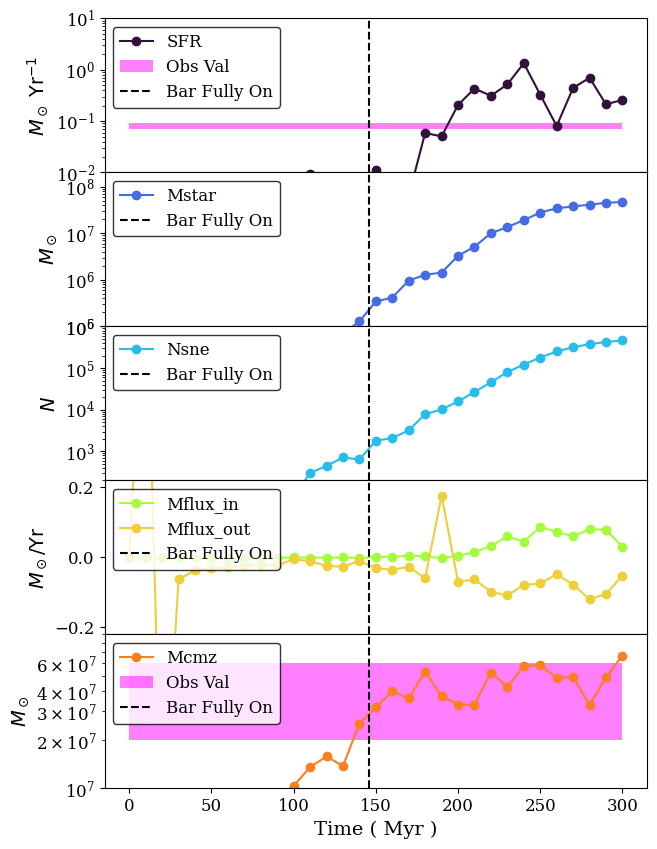

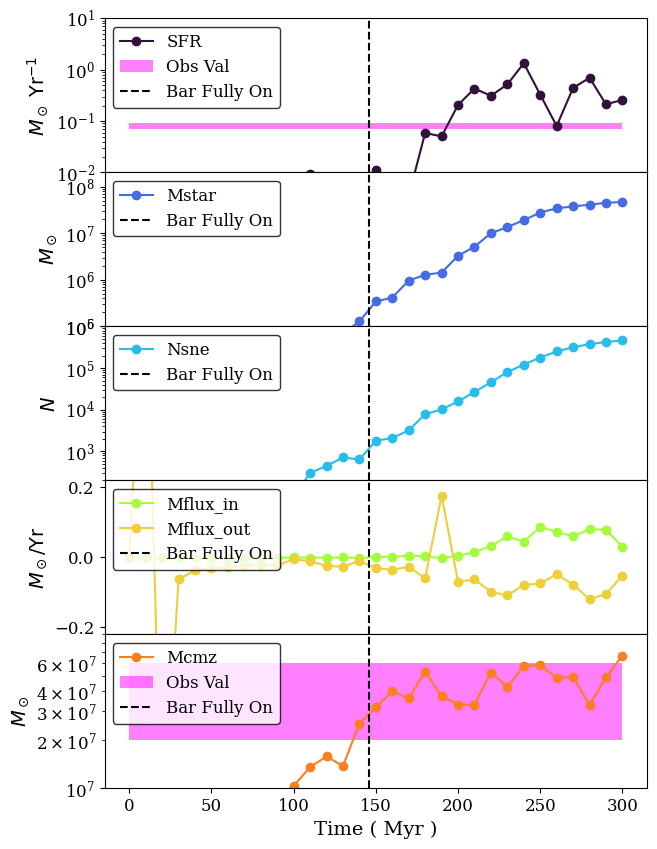

In [55]:
colors = [ plt.get_cmap( 'turbo' )( float( i ) / float( 8 ) ) 
                                       for i in range( 8 ) ]
#colors   = [ colors[0], colors[1],colors[2],colors[3], colors[4],(colors[5],colors[6]),colors[7] ]
colors   = [ colors[0], colors[1],colors[2],(colors[4],colors[5]),colors[6] ]
plt_time_evo( outdata, figsize = ( 7, 10 ),
                       titles = [ "" ],
                           ylims = [ [ 1e-2, 1e1 ], [ 1e5, 2e8 ],
                                     [ 2e2, 1e6 ] , [ -0.22, 0.22 ], [ 1e7, 9e7 ] ],
                           logs  = [ True, True, True, False, True ],
                           colors = colors,
                           fplot = [ draw_obs_val, draw_bar_on ,
                                     draw_bar_on , draw_bar_on, draw_obs_val ] ,
                           fplot_kwargs = [ { "bar_on_time" : 146, "low" : 0.07, "high" : 0.09 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146, "low" : 2e7, "high" : 6e7 }  ] )

In [13]:
d.data['block_0']['particle_Nsne']

KeyError: 'particle_Nsne'

In [12]:
output_data["cmz_fb3_b3e3"]["Nsne"]

{'__func__': <function par_func.f_par_Nsne(d, **kwargs)>,
 '__blk_func__': None,
 'f_kw': {'R_out': 500, 'Z_out': 140, 'R_in': 1000, 'zflux': 500},
 'bf_kw': {'R_out': 500, 'Z_out': 140, 'R_in': 1000, 'zflux': 500},
 'data': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  7e-45,
  5.6e-44,
  1.1e-43,
  4.25e-43,
  6.25e-43,
  1.002e-42,
  8.94e-43,
  2.521e-42,
  2.92e-42,
  4.479e-42,
  1.0939e-41,
  1.4275e-41,
  2.2125e-41,
  3.7252e-41,
  6.4045e-41,
  1.12321e-40,
  1.70357e-40,
  2.51045e-40,
  3.51507e-40,
  4.4436e-40,
  5.25864e-40,
  5.94865e-40,
  6.47281e-40],
 'time': [0.0,
  10.008740949444473,
  20.002731105312705,
  30.005524332867935,
  40.00427906465484,
  50.00137869617811,
  60.00199668868868,
  70.00208658174483,
  80.00001141806257,
  90.00068454199018,
  100.00004104533278,
  110.00062440354402,
  120.00005188041503,
  130.00074554718356,
  140.000302025127,
  150.00053846663513,
  160.000141079404,
  170.00036821386624,
  180.00001721176605,
  190.00009

In [15]:
output_data["cmz_s19"]['Mflux_in, Mflux_out']

{'__func__': <function blk_func.f_blk_massflux(bfd, **kwargs)>,
 '__blk_func__': <function blk_func.bf_hyd_massflux(b, bd, **kwargs)>,
 'f_kw': {'R_out': 500, 'Z_out': 140, 'R_in': 500, 'zflux': 140},
 'bf_kw': {'R_out': 500, 'Z_out': 140, 'R_in': 500, 'zflux': 140},
 'data': [[-8.214070070429591e-06, -0.873481280944848],
  [-0.0007818055227059625, -14.066142464624306],
  [-0.00042002479314547965, -25.718731396815258],
  [-0.0003048856138716762, -1.8188777158354568],
  [-0.00021231761704204892, 0.08364654450756684],
  [-0.00019764638270340743, -0.20185614092543847],
  [-0.0001861066712292506, -0.1329743004468812],
  [-0.0002141175595785412, -0.06854847397494529],
  [-0.00021660302108612373, -0.09439533855060321],
  [0.0006365707935879792, -0.28506616121270373],
  [-0.000663611675181234, -0.11842936097486961],
  [-0.0004534041755627514, -0.06798562018218525],
  [-0.0007599719512224733, -0.03827937849991459],
  [0.0015240823219019408, -0.1470912252871927],
  [-0.0023206706542825938, 0.17

In [5]:
zflux = 140
R_in  = 500
flux_in = 0
flux_out = 0
for b, bd in d.data.items( ):
    if "block" not in b:
        continue
    R = np.sqrt( bd[ 'x_c' ][ 0 ]**2 + bd[ 'x_c' ][ 1 ]**2 )
    dz = bd[ 'dx0' ][ 2 ]
    cell_z_pos = (  zflux > bd[ 'x' ][ 2 ] - dz / 2 ) & (  zflux <= bd[ 'x' ][ 2 ] + dz / 2 )
    cell_z_neg = ( -zflux > bd[ 'x' ][ 2 ] - dz / 2 ) & ( -zflux <= bd[ 'x' ][ 2 ] + dz / 2 )
    cell_R_in  = R < R_in
    cell_area  = bd[ 'dx0' ][ 0 ] * bd[ 'dx0' ][ 1 ]
    flux_in  += np.sum( bd[ 'mom' ][ 2 ][ cell_z_pos & cell_R_in ] ) * cell_area - np.sum( bd[ 'mom' ][ 2 ][ cell_z_neg & cell_R_in ] ) * cell_area
    flux_out += np.sum( bd[ 'mom' ][ 2 ][ cell_z_pos & ~cell_R_in ] ) * cell_area - np.sum( bd[ 'mom' ][ 2 ][ cell_z_neg & ~cell_R_in ] ) * cell_area
    #print( bd[ 'x_c' ][ 2 ][ cell_z ], np.where( cell_z == True ) )
print( flux_in, flux_out )

NameError: name 'd' is not defined

<Axes: xlabel='$\\rho$ ($m_p$ cm$^{-3}$)', ylabel='$T$ (K)'>

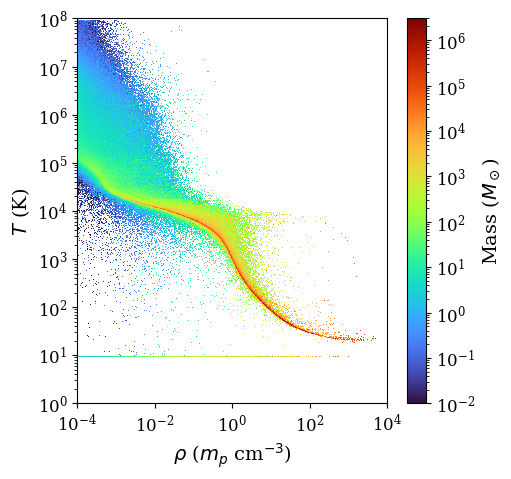

In [10]:
plt_phase( d, vmin=1e-2, vmax=3e6 )#, rho_bins=10**np.linspace( -6, 4, 1000 ) )

<Axes: xlabel='$\\rho$ ($m_p$ cm$^{-3}$)', ylabel='$T$ (K)'>

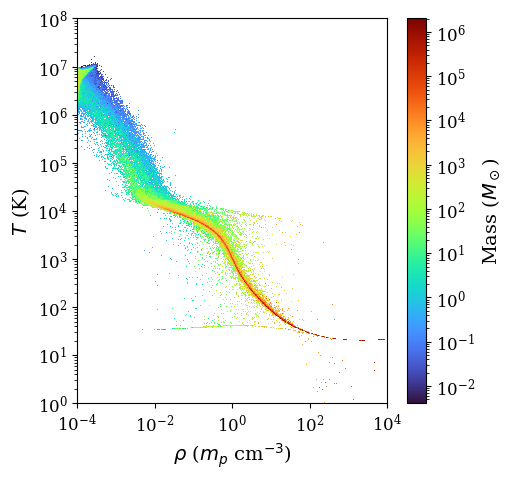

In [10]:
plt_phase( d, weightfunc= lambda bd :   )

In [15]:
s = np.array( [ 1,2,3,4,5,6,7,8,9,10 ] )
bb = ( s < 4 )
~bb

array([False, False, False,  True,  True,  True,  True,  True,  True,
        True])

In [25]:
lowT   = np.array([])
Tall   = np.array([])
momnet = np.array([])
momall = np.array([])
vnet   = np.array([])
vall   = np.array([])
for b, bd in d.data.items( ):
    if "block" not in b:
        continue
    inds = ( bd[ 'T_ent' ] <= 12 )
    lowT = np.concatenate( ( lowT, bd[ 'T_ent' ][ inds ] ) )
    Tall = np.concatenate( ( Tall, bd[ 'T_ent' ].flatten( ) ) )
    momtot = np.sqrt( np.sum( bd[ 'mom' ]**2, axis=0 ) )
    momnet = np.concatenate( ( momnet, momtot[ inds ] ) )
    momall = np.concatenate( ( momnet, momtot[ ~inds ] ) )
    vtot   = np.sqrt( np.sum( bd[ 'mom' ]**2, axis=0 ) ) / bd[ 'rho' ]
    vnet   = np.concatenate( ( vnet, vtot[ inds ] ) )
    vall   = np.concatenate( ( vnet, vtot[ ~inds ] ) )


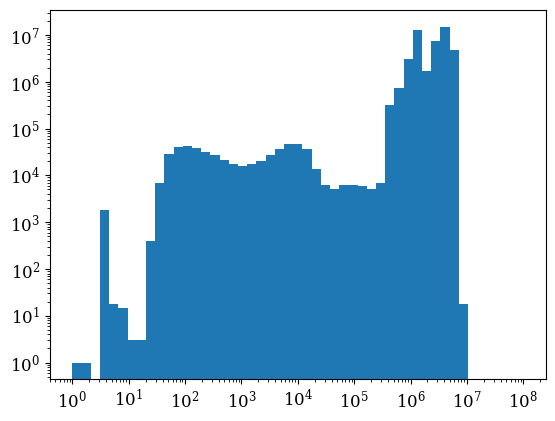

In [28]:
#plt.hist( vnet, bins=10**np.linspace( 1, 4 ), density=True )
#plt.hist( vall, bins=10**np.linspace( 1, 4 ), density=True )
plt.hist( Tall, bins=10**np.linspace( 0, 8 ) )
plt.xscale('log')
plt.yscale('log')

In [11]:
d_out = d
r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
R = np.sqrt( np.sum( d_out.data['particle_x'].T[ :2 ]**2, axis=0 ) )
z = d_out.data['particle_x'].T[ 2 ]
in_cmz = ( R < 500 ) & ( np.abs( z ) < 140 )
mstar = d_out.data['particle_mstar']
m = d_out.data['particle_m']
sfr = d_out.data['particle_sfr']
SFdelay = d_out.data['particle_SFdelay']
RS0 = d_out.data['particle_RS0']

cmz_mstar = np.sum( ( mstar )[ in_cmz ] ) * m0 / modot / 1e8
cmz_sfr = np.sum(sfr[ in_cmz ]) * m0 / modot / ( t0 / yr )
cmz_sfrv2 = np.sum(sfr[ (SFdelay == 0) & in_cmz ]) * m0 / modot / ( t0 / yr )
print( cmz_mstar, cmz_sfr )


0.02602699179466039 0.2267817325370003


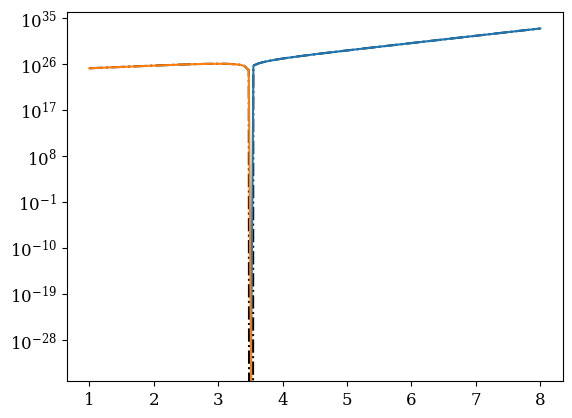

In [57]:
lam = 10**np.linspace( 23, 33, 100 )
gam = 10**np.linspace( 25.2, 29, 100 )
diff = lam - gam
ln_shift = np.max( np.log( np.abs( diff ) ) )

lndiff = np.sign( diff ) * ( np.log( np.abs( diff ) ) + ln_shift )
T = np.linspace( 1, 8, 100 )
denseT = np.linspace( 1, 8, 10000 )

data = np.interp( denseT, T, lndiff )



plt.plot( T, diff, '-.k' )
plt.plot( T, -diff, '-.k' )
plt.plot( denseT, np.sign( data ) * np.exp( np.abs( data ) - ln_shift ) )
plt.plot( denseT, -np.sign( data ) * np.exp( np.abs( data ) - ln_shift ) )
plt.yscale( 'log' )

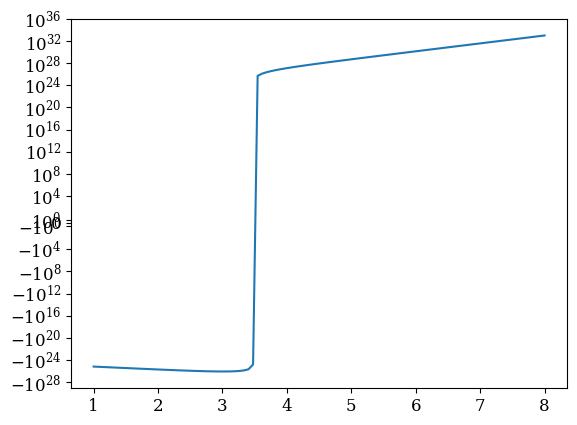

In [59]:
plt.plot( T, diff )
plt.yscale( 'symlog' )

In [53]:
lndiff

array([-133.53978505, -133.63130495, -133.72259531, -133.81362081,
       -133.90434057, -133.99470717, -134.08466552, -134.17415159,
       -134.26309074, -134.3513959 , -134.43896513, -134.5256789 ,
       -134.61139649, -134.69595175, -134.77914763, -134.86074929,
       -134.94047535, -135.01798637, -135.09286979, -135.16461963,
       -135.23260877, -135.29605012, -135.35394104, -135.40498119,
       -135.44744711, -135.47899279, -135.49631644, -135.49456887,
       -135.46621772, -135.39862845, -135.26809831, -135.02139362,
       -134.48862316,           nan,  134.81424126,  135.67262981,
        136.24495259,  136.70110083,  137.09430819,  137.44827743,
        137.7756431 ,  138.08393754,  138.37800995,  138.66116213,
        138.93574008,  139.20346725,  139.46564399,  139.72327295,
        139.9771412 ,  140.22787587,  140.47598295,  140.72187498,
        140.96589141,  141.20831363,  141.44937646,  141.68927696,
        141.9281813 ,  142.16623015,  142.40354309,  142.64022

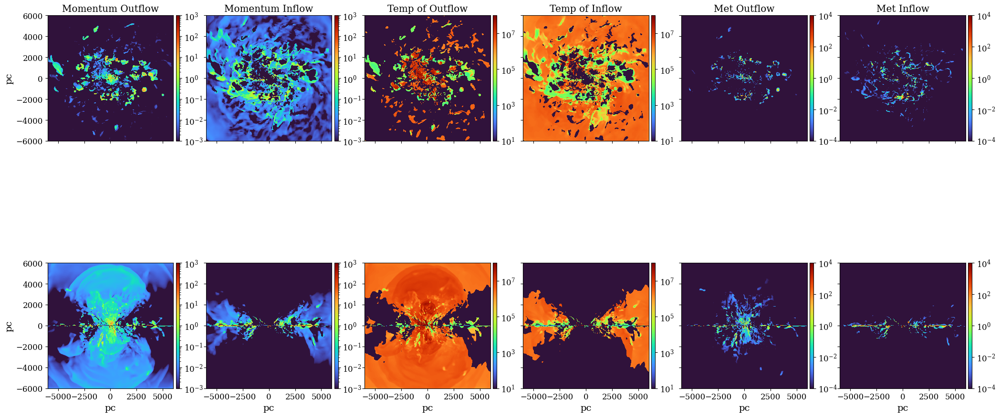

In [3]:
%reload_ext autoreload
#d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb4_nobondi_{fstring( 20 )}.bin', -1, enroll_prim=True, data_type = cmz_data );
enroll_flux( d, 'mass', lambda bd : bd[ 'rho' ] * np.prod( bd[ 'dx' ], axis=0 ) )
enroll_flux( d, 'met_fld' )
enroll_sgn( d, 'mom' )
enroll_sgn( d, "T_ent", "sgnvel" )
enroll_sgn( d, "met", "sgnvel" )

fig2 = f_plot_grid( d,  figsize=( 25, 13.5 ), 
                    xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], 
                    ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ],
                    #log   = [ True, True, True, False ],
                    locs  = [ [ 200, 200, 200, 200, 200, 200 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    z0s   = [ 1, -1, 1, -1, 1, -1 ],
                    flds  = [ 'sgnmom[2]', 'sgnmom[2]', 'sgnT_ent[2]', 'sgnT_ent[2]', 'sgnflux_met_fld[2]', 'sgnflux_met_fld[2]' ],
                    names = [ 'Momentum Outflow', "Momentum Inflow", "Temp of Outflow", "Temp of Inflow","Met Outflow", "Met Inflow" ],
                    zlims = [ ( 1e-3,1e3 ), ( 1e-3, 1e3 ), ( 1e1, 1e8 ), ( 1e1, 1e8 ), ( 1e-4,1e4 ), ( 1e-4, 1e4 ) ],
                    part_plot_i = [] )#( 1e-4, 1 ) ] )

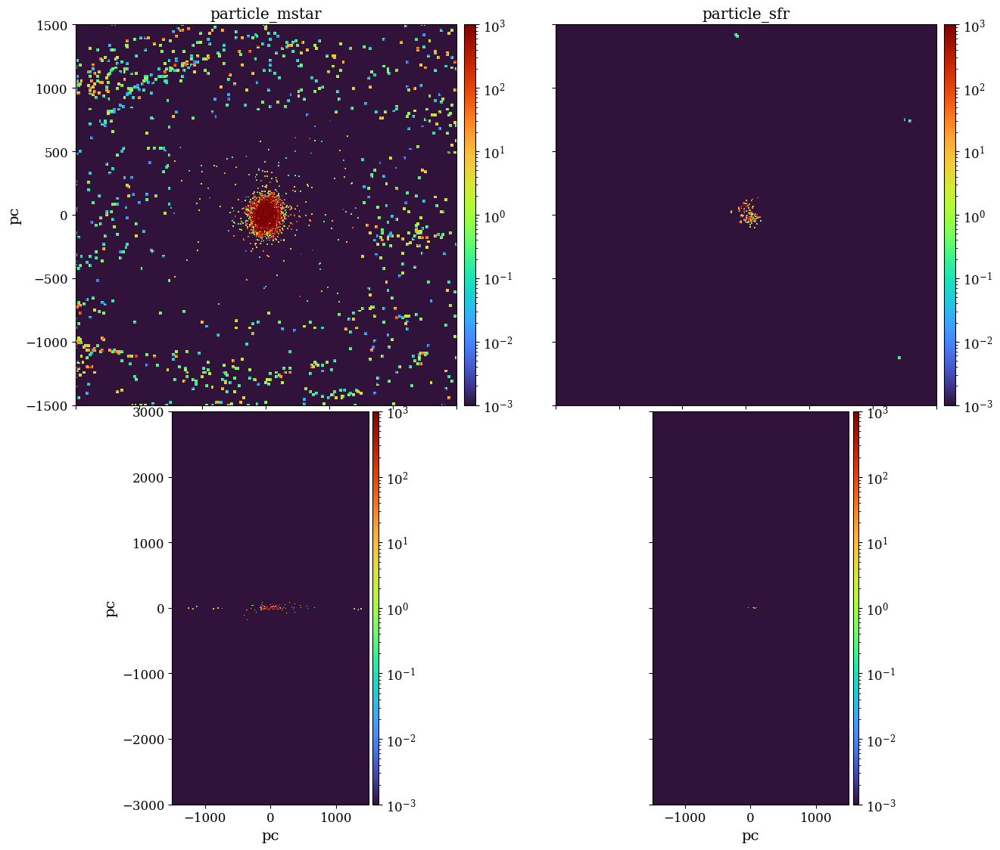

In [3]:
enroll_mesh_tree( d )
map_particle_blk( d, "particle_mstar", "particle_sfr" )
fig3 = f_plot_grid( d,  figsize=( 15, 13.5 ),
                   flds = [ 'particle_mstar', "particle_sfr" ],
                   part_plot_i = [] )

In [186]:
import builtins
x_f = d.data['block_0']['x_f']
prism_bounds = np.array( [ [ -5940, -5930 ], [ -5000, -4999 ], [ -5230, -5220 ] ] )
slices = []
for axis in range(3):
    faces = x_f[axis]
    lo, hi = prism_bounds[axis]

    # Cell i spans faces[i] to faces[i+1].
    # It overlaps the prism if faces[i] < hi  AND  faces[i+1] > lo
    i_start = np.searchsorted(faces, lo, side='left') - 1   # last cell whose left face < hi
    i_end   = np.searchsorted(faces, hi, side='right')      # first cell whose right face > lo (exclusive upper bound for cells, since cell i right face = faces[i+1])

    # Clamp to valid cell range [0, n_cells - 1]
    n_cells = len(faces) - 1
    i_start = max(0, i_start)
    i_end   = min(n_cells, i_end)
    print( i_start, i_end )

    slices.append( builtins.slice(i_start, i_end) )
i_idx, j_idx, k_idx = np.mgrid[slices[0], slices[1], slices[2]]
for i in np.array( [ i_idx.flatten(), j_idx.flatten( ), k_idx.flatten() ] ).T:
    print( d.data['block_0']['x_f'][ 0 ][ i[ 0 ] ], 
           d.data['block_0']['x_f'][ 1 ][ i[ 1 ] ],
           d.data['block_0']['x_f'][ 2 ][ i[ 2 ] ] )


1 2
21 22
16 17
-5953.125 -5015.625 -5250.0


In [24]:
src_min =  1e32;
src_max = -1e32;
for b, bd in dbug.data.items():
    if "block" not in b:
        continue 
    src = bd[ 'T_ent' ];
    src_min = minimum( src_min, src.min(  ) );
    src_max = maximum( src_max, src.max(  ) );
print( src_min, src_max )

9.366668046823476 120497898.81351615


In [25]:
src_min =  1e32;
src_max = -1e32;
for b, bd in d.data.items():
    if "block" not in b:
        continue 
    src = bd[ 'T_ent' ];
    src_min = minimum( src_min, src.min(  ) );
    src_max = maximum( src_max, src.max(  ) );
print( src_min, src_max )

9.366672861581865 94022395.0025563


file: ../cmz/cmz_test/outputs/cmz_fb4_mgtst_00001.bin; time = 0.0151436


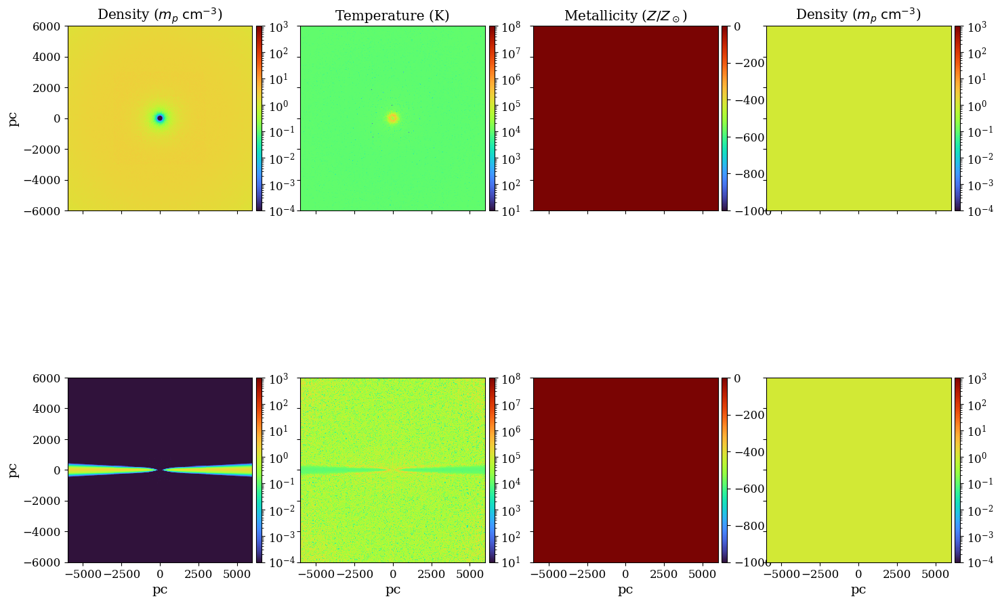

In [4]:
i = 1
fstring = (5 - len(str(i)))*"0" + str(i)
d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb4_mgtst_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
fig2 = f_plot_grid( d,  figsize=( 17, 13.5 ), 
                    xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], 
                    ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ],
                    log   = [ True, True, False, True ],
                    z0s   = [ 1, 1, 1, 1 / ( 4 * np.pi * G_code ) ],
                    flds  = [ 'rho', 'T_ent', 'fld_d[0]', 'src_d[0]' ],
                    zlims = [ ( 1e-4, 1e3 ), ( 1e1, 1e8 ), ( -1e3, 0 ), ( 1e-4, 1e3 ) ],
                    part_plot_i = [] )#( 1e-4, 1 ) ] )

In [4]:
i = 15
debug_i = 301920
fstring = (5 - len(str(i)))*"0" + str(i)
d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb1_mergefull_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
d2 = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb2_mergefull_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
d3 = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb3_mergefull_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
d4 = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb4_nobondi_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );

data_fields = { d, d2, d3, d4 }

#d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_particle_test_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
#d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb2_nofb_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
#d  = get_last_dd( f'../cmz/optimize/par_tst/pt_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
#dbug  = get_last_dd( f'../cmz/cmz_test/debug_{debug_i}.bin', -1, enroll_prim=True, data_type = cmz_data );

file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00015.bin; time = 150.001
file: ../cmz/cmz_test/outputs/cmz_fb2_mergefull_00015.bin; time = 150
file: ../cmz/cmz_test/outputs/cmz_fb3_mergefull_00015.bin; time = 150
file: ../cmz/cmz_test/outputs/cmz_fb4_nobondi_00015.bin; time = 150


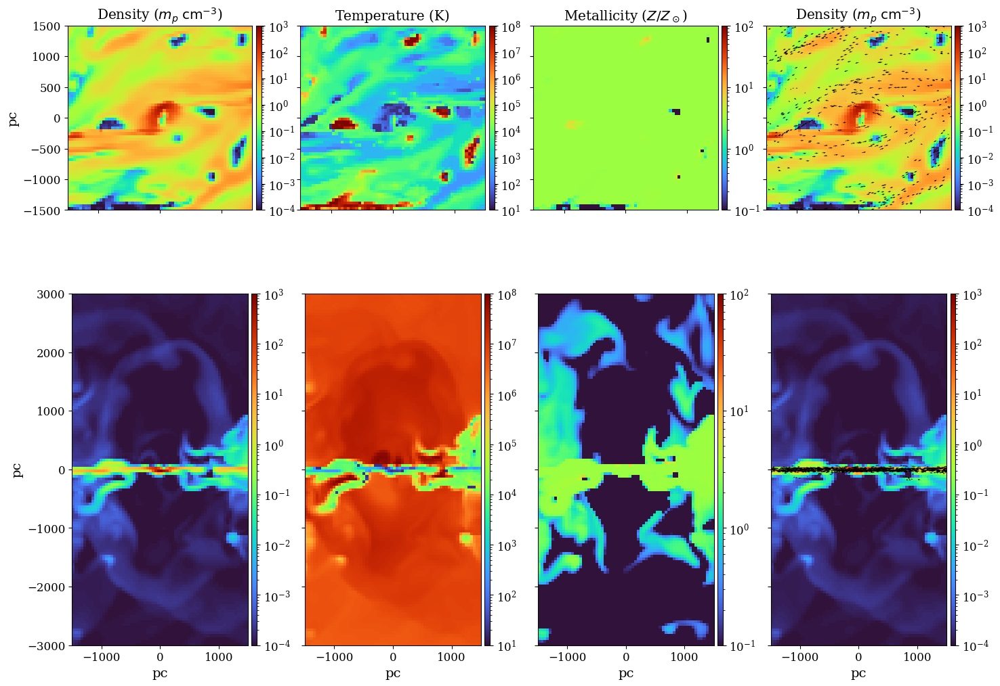

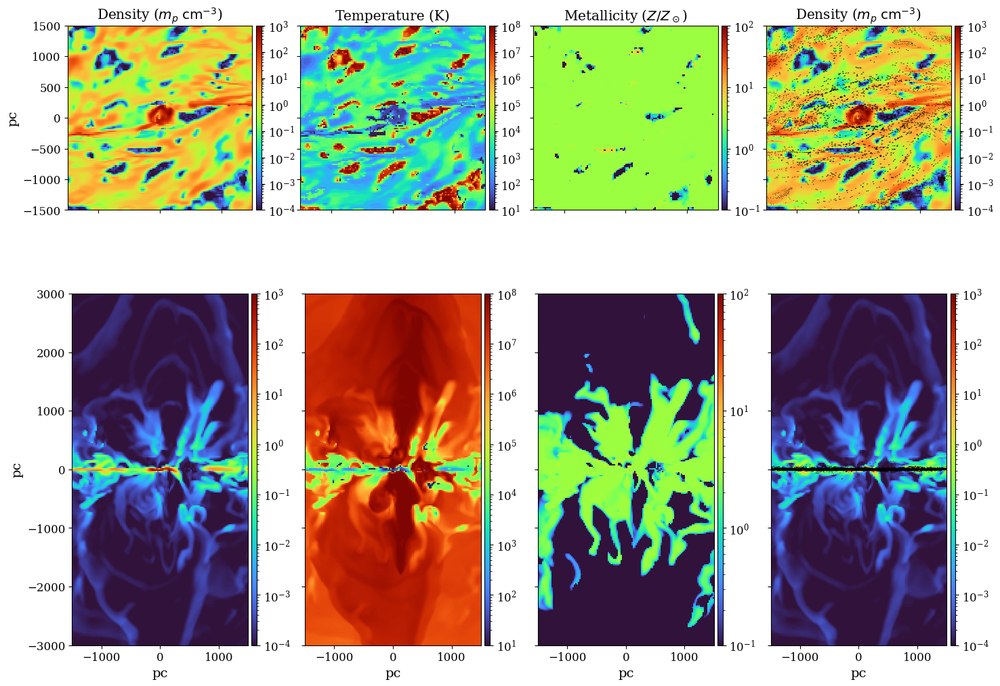

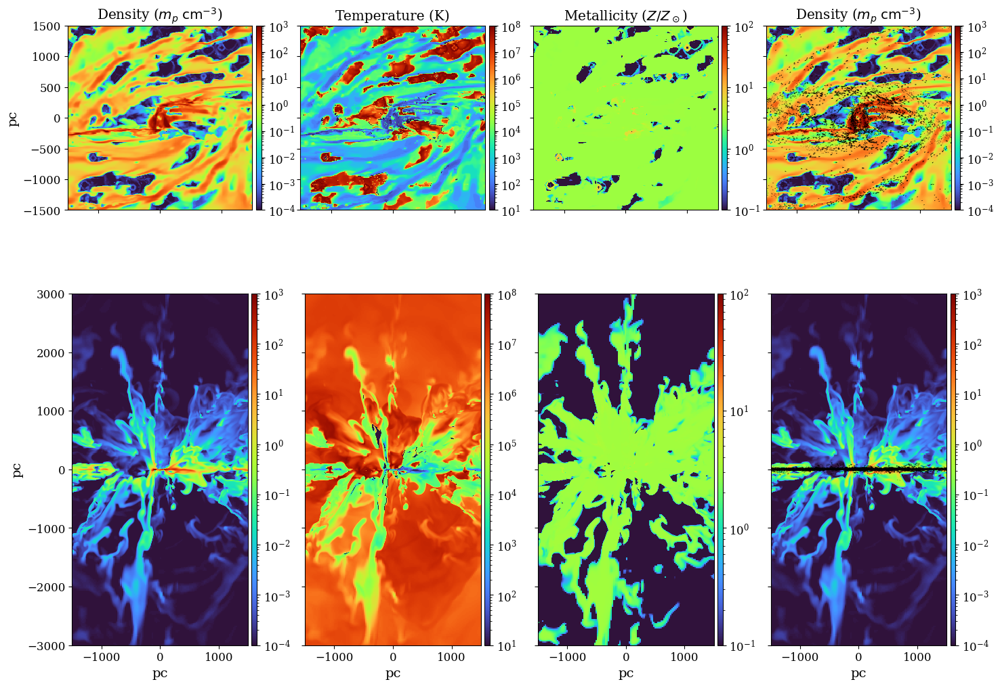

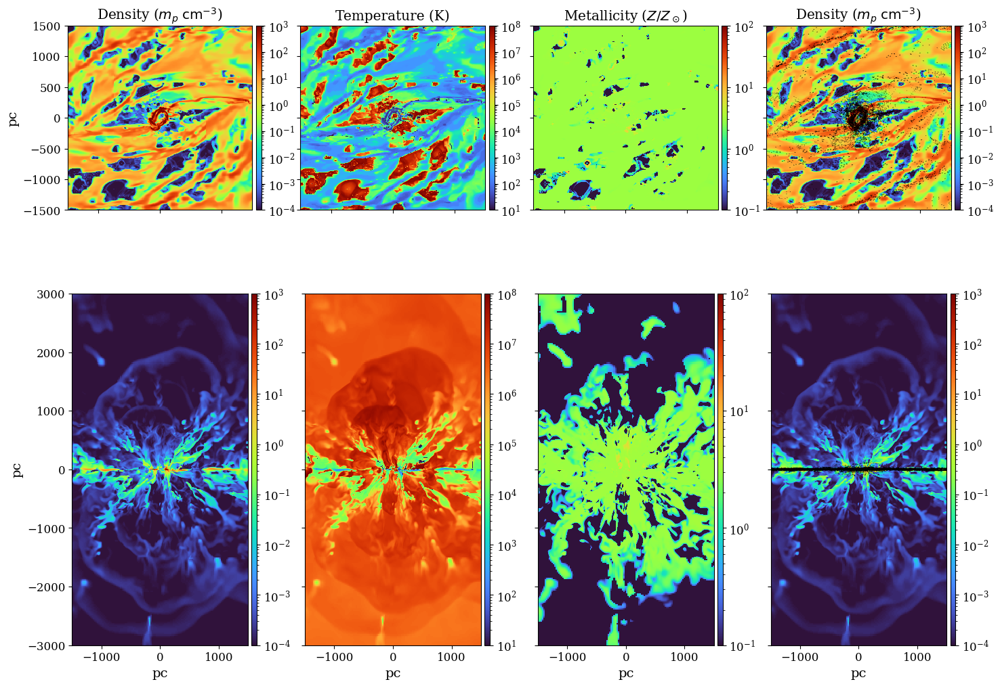

In [5]:
fig1 = f_plot_grid( d,  figsize=( 17, 13.5 ) )#, xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ] )
fig2 = f_plot_grid( d2, figsize=( 17, 13.5 ) )#, xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ] )
fig3 = f_plot_grid( d3, figsize=( 17, 13.5 ) )#, xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ] )
fig4 = f_plot_grid( d4, figsize=( 17, 13.5 ) )#, xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ] )

#fig1 = f_plot_grid( d,  figsize=( 17, 13.5 ) )
#fig2 = f_plot_grid( d2, figsize=( 17, 13.5 ) )
#fig3 = f_plot_grid( d3, figsize=( 17, 13.5 ) )

#fig3 = f_plot_grid( d3, figsize=( 17, 13.5 ) )
#f_plot_grid( d2, figsize=( 17, 13.5 ), xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ] )
#f_plot_grid( d, figsize=( 17, 13.5 ), flds = [ "rho", "T_ent", "met", "fld_d[0]" ], 
#                                      log = [ True, True, True, False ],
#                                      xlims= [ ( -6000, 6000 ), ( -6000, 6000 ) ],
#                                      ylims = [ (-6000, 6000 ), ( -6000, 6000 ) ])

/tmp/ipykernel_2961367/970039986.py:13: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar[r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
/tmp/ipykernel_2961367/970039986.py:15: RuntimeWarning: overflow encountered in multiply
  ax.hist(( m    [r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
/tmp/ipykernel_2961367/970039986.py:17: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
/tmp/ipykernel_2961367/970039986.py:19: RuntimeWarning: overflow encountered in multiply
  ax.hist(( m )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),


10533


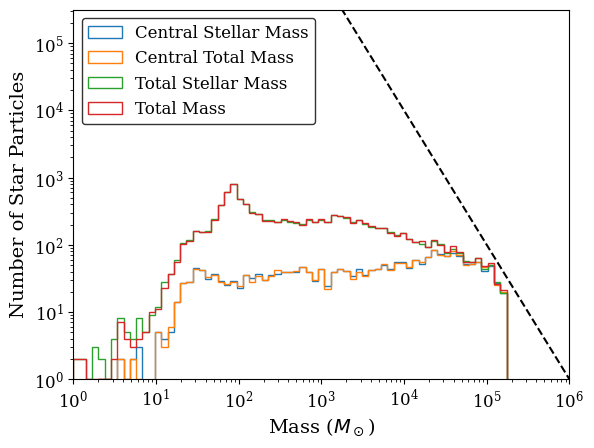

In [5]:
d_out = d
r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
mstar = d_out.data['particle_mstar']
m = d_out.data['particle_m']
sfr = d_out.data['particle_sfr']
SFdelay = d_out.data['particle_SFdelay']
RS0 = d_out.data['particle_RS0']
f,ax = plt.subplots()

xminlog = 0
xmaxlog = 6

ax.hist(( mstar[r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Central Stellar Mass')
ax.hist(( m    [r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Central Total Mass')
ax.hist(( mstar )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Total Stellar Mass')
ax.hist(( m )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Total Mass')
#ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
#         histtype='step',fill=False,stacked=False, label='Gas Mass')
ax.set_xscale('log')
ax.set_yscale('log')
x = 10**np.linspace(2,10,100)
ax.plot(x, 10**12*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**xminlog,10**xmaxlog])
ax.set_ylim([1e0,10**5.5])
ax.set_ylabel("Number of Star Particles")
ax.legend()
print( len( m ) )


In [12]:
m[ np.isnan(m) ]

array([], dtype=float32)

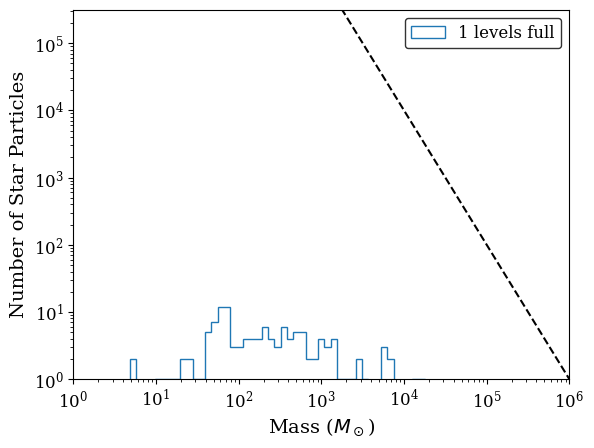

In [7]:
f,ax = plt.subplots()
#labels = ["full merge v2","merge < 200 Msun", "full merge", "merge < 200 Msun hres"]
labels = [ "1 levels", "2 levels", "3 levels", "4 levels" ]
for j, d_out in enumerate([d]):#, d2, d3, d4]):
    x,   y,  z = d_out.data[ 'particle_x' ].T;
    r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
    R = np.sqrt( x**2 + y**2 )
    mstar = d_out.data['particle_mstar']
    m = d_out.data['particle_m']
    sfr = d_out.data['particle_sfr']
    SFdelay = d_out.data['particle_SFdelay']
    RS0 = d_out.data['particle_RS0']
    

    xminlog = 0
    xmaxlog = 6

    #ax.hist(( mstar[r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
    #         histtype='step',fill=False,stacked=False, label=labels[j])
    ax.hist(( mstar[ ( r < 500 ) & ( np.abs( z ) < 140 ) ] )*units.m0/units.modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
             histtype='step',fill=False,stacked=False, label=labels[j] + " full")
    #ax.hist(( m    [r < 500] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
    #         histtype='step',fill=False,stacked=False, label='Central Total Mass')
    #ax.hist(( mstar )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
    #         histtype='step',fill=False,stacked=False, label='Total Stellar Mass')
    #ax.hist(( m )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
    #         histtype='step',fill=False,stacked=False, label='Total Mass')
    #ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
    #         histtype='step',fill=False,stacked=False, label='Gas Mass')
ax.set_xscale('log')
ax.set_yscale('log')
x = 10**np.linspace(2,10,100)
ax.plot(x, 10**12*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**xminlog,10**xmaxlog])
ax.set_ylim([1e0,10**5.5])
ax.set_ylabel("Number of Star Particles")
ax.legend()
#print( len( m ) )

In [16]:
m0

In [10]:
from decimal import Decimal
for i in [ d, d2, d3, d4 ]:
    mass     = Decimal( str( np.sum( i.data['particle_m'] )     ) )
    starmass = Decimal( str( np.sum( i.data['particle_mstar'] ) ) )
    
    print( '{:.2e}'.format( mass ), '{:.2e}'.format( starmass ) )

8.81e+8 7.83e+8
1.94e+9 1.83e+9
2.50e+9 1.77e+9
1.47e+9 1.41e+9


In [6]:
d_out = d
r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
mstar = d_out.data['particle_mstar']
m = d_out.data['particle_m']
sfr = d_out.data['particle_sfr']
SFdelay = d_out.data['particle_SFdelay']
RS0 = d_out.data['particle_RS0']

In [7]:
np.sum( ( mstar )[ r < 500 ] ) * m0 / modot / 1e8

0.5546968364008854

In [19]:
np.sum(sfr[ (r < 500) ]) * m0 / modot / ( t0 / yr )

0.6492812303723292

In [11]:
np.sum(sfr[ (SFdelay == 0) & (r < 500) ]) * m0 / modot / ( t0 / yr )

5.1234508551041715e-08

In [78]:
dyt = load_kratos_yt( d4, delete_file=True )

yt : [WARNING  ] 2026-04-13 14:50:39,598 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-04-13 14:50:39,599 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-04-13 14:50:39,600 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-04-13 14:50:39,600 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-04-13 14:50:39,601 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-04-13 14:50:39,646 Parameters: current_time              = 280.00001404047543
yt : [INFO     ] 2026-04-13 14:50:39,646 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-04-13 14:50:39,647 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-04-13 14:50:39,647 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-04-13 14:50:39,648 Parameters: cosmological_simulation   = 0


yt : [INFO     ] 2026-04-13 14:50:41,592 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:41,593 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:41,595 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:41,595 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:41,596 Making a fixed resolution buffer of (('gas', 'temperature')) 800 by 800



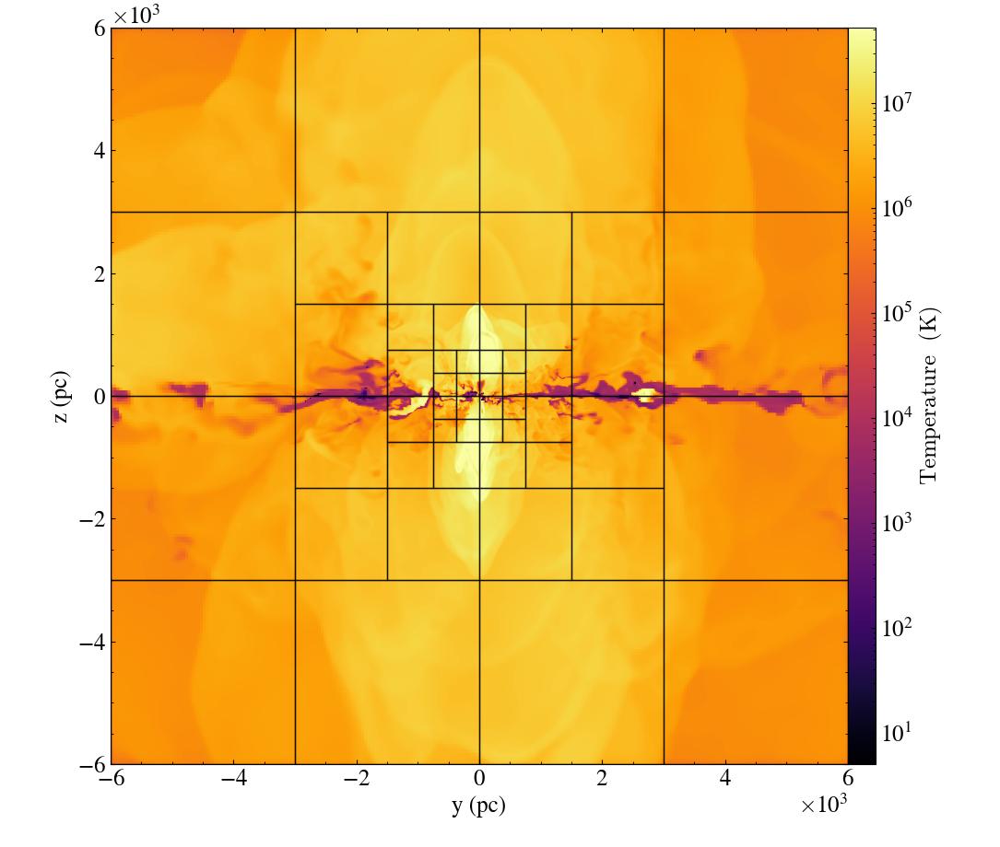

In [79]:
import yt


slc = yt.SlicePlot(dyt, "x", ("gas", "temperature"))
slc.set_cmap(("gas", "temperature"), "inferno")
slc.set_unit(("gas", "temperature"), "K")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)

#slc.save("yt_temp.png")
slc.show()

yt : [INFO     ] 2026-04-13 14:50:50,541 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:50,542 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:50,544 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:50,544 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:50:50,545 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



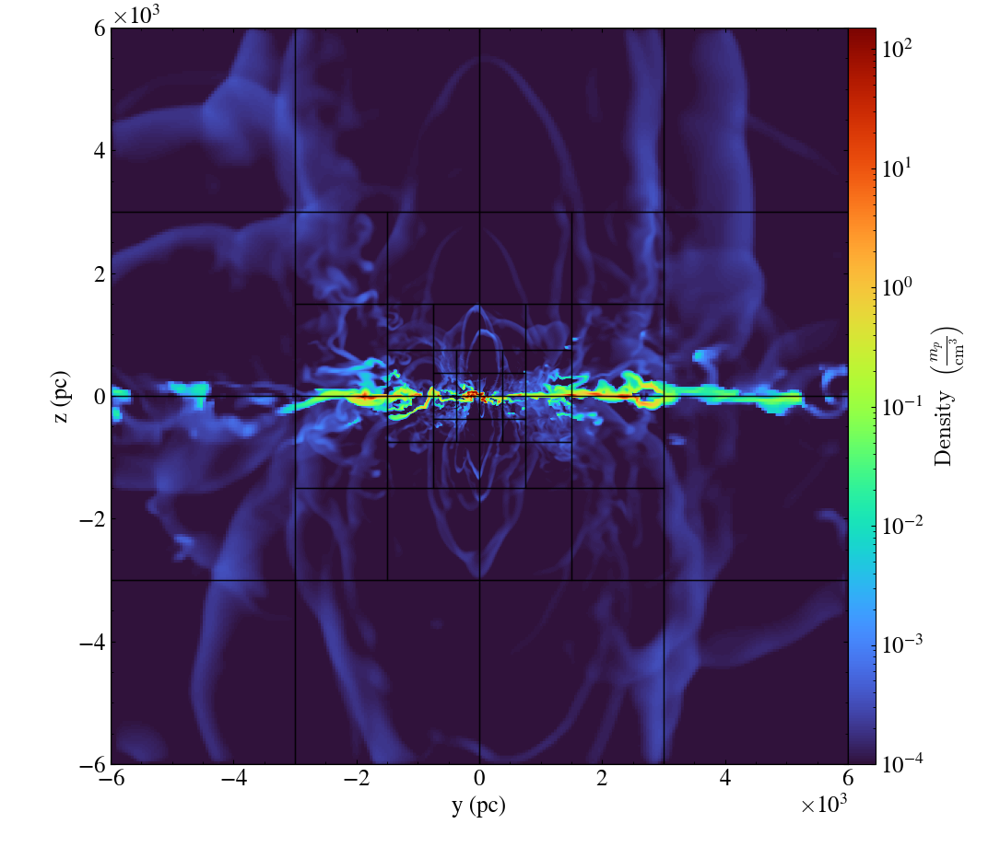

In [80]:
slc = yt.SlicePlot(dyt, "x", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**3")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
#slc.save("yt_dens.png")
slc.show()

pyxsim : [WARNING  ] 2026-04-13 14:51:01,670 For the 'cloudy' model, the only available abundance table is 'feld', so using that one.
pyxsim : [INFO     ] 2026-04-13 14:51:01,859 kT_min = 0.2 keV
pyxsim : [INFO     ] 2026-04-13 14:51:01,860 kT_max = 64 keV
pyxsim : [WARNING  ] 2026-04-13 14:51:01,861 Not all fields have the same field type! Fields used: [('gas', 'density'), ('gas', 'temperature'), ('athena_pp', 'metallicity')]
pyxsim : [INFO     ] 2026-04-13 14:51:01,861 Using emission measure field '('gas', 'density')'.
pyxsim : [INFO     ] 2026-04-13 14:51:01,861 Using temperature field '('gas', 'temperature')'.
yt : [INFO     ] 2026-04-13 14:51:54,124 Projection completed
yt : [INFO     ] 2026-04-13 14:51:54,128 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:51:54,128 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:51:54,131 xlim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04-13 14:51:54,132 ylim = -6000.000000 6000.000000
yt : [INFO     ] 2026-04


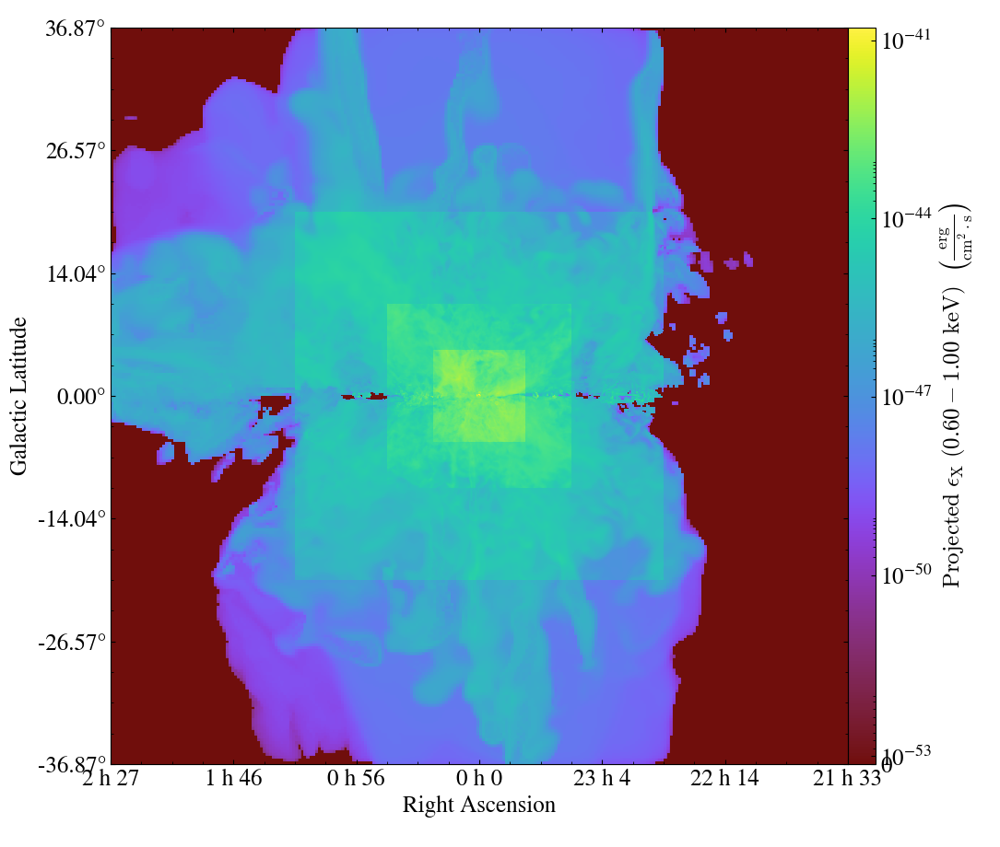

In [81]:
from matplotlib.ticker import FuncFormatter
import pyxsim
D = 8000
def y_to_angle( y, pos ):
    theta = np.arctan(y / D)
    return f"{np.degrees(theta):.2f}°"
def x_to_RA( x, pos ):
    theta = np.arctan(-x / D)
    if theta < 0:
        theta += 2*np.pi#- theta
    RA = theta * 12 / np.pi
    hour = int( floor( RA ) )
    min = round( ( RA - hour ) * 60 )
    return f"{hour} h {min}"
thermal_model  = pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, ( "athena_pp", "metallicity" ), kT_min=0.2, emission_measure_field=( "gas", "density" )  )
#thermal_model  = pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, 1, kT_min=0.2, emission_measure_field=( "gas", "density" )  )
#thermal_model2 = pyxsim.IGMSourceModel( "cloudy", 0.05, 11, 10000, ( "athena_pp", "metallicity" ), kT_min=0.1, emission_measure_field=( "gas", "density" )  )
xray = thermal_model.make_source_fields( dyt, 0.6, 1 )
prj = yt.ProjectionPlot(
    dyt, "x", ("gas", 'xray_emissivity_0.6_1_keV')
)
prj.set_unit( ("gas", 'xray_emissivity_0.6_1_keV'), "erg/s/cm**2" )
prj.set_axes_unit( 'pc' )
prj.set_ylabel('Galactic Latitude')
prj.set_xlabel('Right Ascension')

prj._setup_plots()
ax = prj.plots[("gas", 'xray_emissivity_0.6_1_keV')].axes
ax.yaxis.set_major_formatter(FuncFormatter(y_to_angle))
ax.xaxis.set_major_formatter(FuncFormatter(x_to_RA))
prj.show()

In [11]:
enroll_mesh_tree( d4 )
densities       = np.array( [] )
temperatures     = np.array( [] )
masses          =  np.array( [] )
cmzdensities    = np.array( [] )
cmztemperatures = np.array( [] )
cmzmasses    = np.array( [] )
for b, bd in d_out.data.items(  ):
    if 'particle' in b:
        continue;
    densities    = np.concatenate( ( densities  , bd[ 'rho'  ].flatten( ) ) )
    temperatures = np.concatenate( ( temperatures, bd[ 'T_ent'].flatten( ) ) )
    masses       = np.concatenate( ( masses     , ( bd[ 'rho' ] * np.prod( bd['dx0'] ) ).flatten( ) ) )
    if bd['level'] == 4:
        rcyl = np.sqrt( bd['x_c'][0]**2 + bd['x_c'][1]**2 )
        zcyl = np.abs( bd['x_c'][2] )
        cmzdensities    = np.concatenate( ( cmzdensities    , bd['rho'][ ( rcyl < 500 ) & ( zcyl < 140   ) ].flatten() ) )
        cmztemperatures = np.concatenate( ( cmztemperatures , bd['T_ent'][ ( rcyl < 500 ) & ( zcyl < 140 ) ].flatten() ) )
        cmzmasses       = np.concatenate( ( cmzmasses     , ( bd[ 'rho' ] * np.prod( bd['dx0'] ) )[ ( rcyl < 500 ) & ( zcyl < 140 ) ].flatten() ) )

In [27]:
len( densities )
len( temperatures )

31457280

Text(0, 0.5, '$T$ (K)')

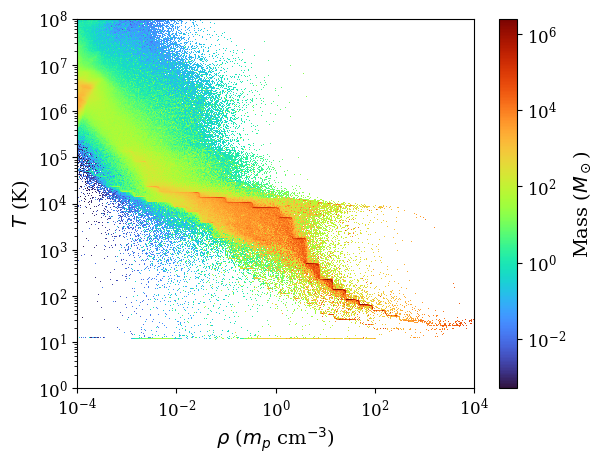

In [12]:
#densities = []
#temperature = []
#for b, bd in d.data.items(  ):
#    if 'particle' in b:
#        continue;
#    densities.append( bd['rho'] )
#    temperature.append( bd['T_ent'] )
#densities = np.array( densities ).flatten()
#temperature = np.array( temperature ).flatten()
s = plt.hist2d( densities, temperatures, weights=masses*m0/modot, bins=[ 10**np.linspace(-4,4,1000), 10**np.linspace( 0, 8, 1000 ) ], norm=LogNorm() )
cbar = plt.colorbar(s[3])
cbar.set_label(r'Mass ($M_\odot$)')
#plt.scatter( densities, temperatures, s=0.1 )
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\rho$ ($m_p$ cm$^{-3}$)')
plt.ylabel(r'$T$ (K)')
#plt.savefig('total_phaseplot.png', dpi=300,bbox_inches='tight')

In [28]:
len( cmzdensities )
len( cmztemperatures )

0

Text(0, 0.5, '$T$ (K)')

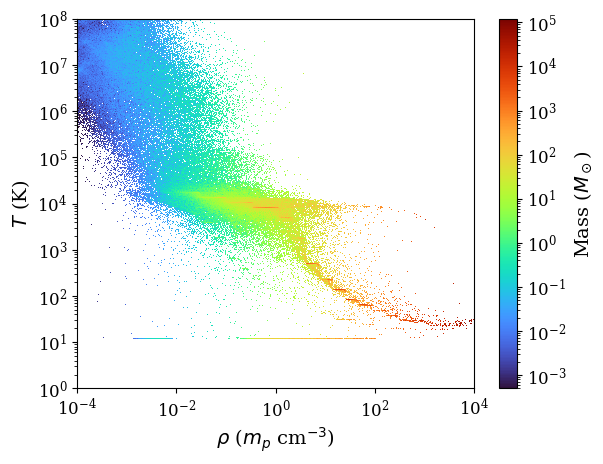

In [13]:
s = plt.hist2d( cmzdensities, cmztemperatures, weights=cmzmasses*m0/modot, bins=[ 10**np.linspace(-4,4,1000), 10**np.linspace( 0, 8, 1000 ) ], norm=LogNorm() )
cbar = plt.colorbar(s[3])
cbar.set_label(r'Mass ($M_\odot$)')
#plt.scatter( densities, temperatures, s=0.1 )
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\rho$ ($m_p$ cm$^{-3}$)')
plt.ylabel(r'$T$ (K)')
#plt.savefig('cmz_phaseplot.png', dpi=300,bbox_inches='tight')


In [59]:
10**np.linspace(np.min(np.log10(RS0)),np.max(np.log10(RS0)),50)


array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan])

Text(0, 0.5, 'Number of Particles')

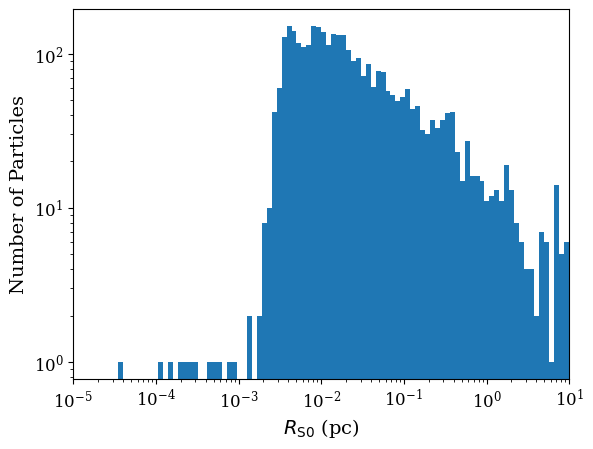

In [5]:
RS0_ = RS0[ RS0 > 0 ]
plt.hist(RS0_,bins=10**np.linspace(np.min(np.log10(RS0_)),np.max(np.log10(RS0_)),100))
plt.xscale('log')
plt.yscale('log')
plt.xlim([1e-5,1e1])
plt.xlabel(r'$R_\mathrm{S0}$ (pc)')
plt.ylabel('Number of Particles')
#plt.savefig('RS0_hist.png',dpi=300)

In [39]:
np.min(d.data['block_101']['T'])

11.735763221384921

In [5]:
def Stromgren( ms, n0=1e2, T=10**4 ):
    """ Calculate Stromgren radius in cm
    ms : ionizing source luminosity in solar luminosities
    n0 : ambient number density in cm^-3
    alphaB : recombination coefficient in cm^3 s^-1
    """ 
    alphaB = 2.56e-13 * ( T / 1e4 )**-0.83
    QH = 10**52.6110 * ( ms / 10**6 ); # ionizing photons per second
    Rs = ( 3 * QH / ( 4 * np.pi * alphaB * n0**2 ) )**( 1./3. );
    return Rs;

In [6]:
def LarsonPenston( dx, T, mu=1.26 ):
    cs2 = kb * T / ( mu * mp );
    return ( 8.86 / np.pi ) * cs2 / ( G * dx**2 )

In [22]:
LarsonPenston( 3 * pc, 100 ) / rho0

1930.8526851588747

/tmp/ipykernel_402798/2312771401.py:3: RuntimeWarning: overflow encountered in multiply
  ax.hist(( m )*m0/modot,bins=10**np.linspace(1,5,80),
/tmp/ipykernel_402798/2312771401.py:5: RuntimeWarning: overflow encountered in multiply
  ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),


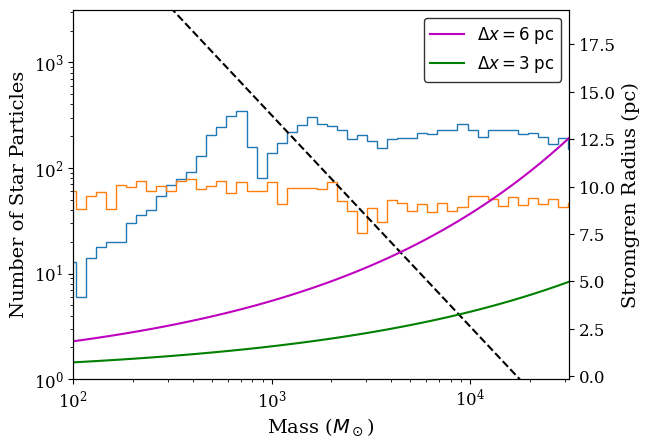

In [7]:
f,ax = plt.subplots()
ax2 = ax.twinx()
ax.hist(( m )*m0/modot,bins=10**np.linspace(1,5,80),
         histtype='step',fill=False,stacked=False)
ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
         histtype='step',fill=False,stacked=False)
ax.set_xscale('log')
ax.set_yscale('log')


x = 10**np.linspace(2,5,100)
ax2.plot(x,Stromgren(x,n0=LarsonPenston( 6 * pc, 50 ) / rho0 / 1.26,T=2e4)/pc, '-m',label=r'$\Delta x = 6 \; \mathrm{pc}$')
ax2.plot(x,Stromgren(x,n0=LarsonPenston( 3 * pc, 50 ) / rho0 / 1.26,T=2e4)/pc, '-g',label=r'$\Delta x = 3 \; \mathrm{pc}$')

ax.plot(x, 10**8.5*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**2,10**4.5])
ax.set_ylim([1e0,10**3.5])
ax.set_ylabel("Number of Star Particles")
ax2.set_ylabel("Stromgren Radius (pc)")
ax2.legend()
#plt.savefig("cmz_stromgren_radius_vs_mass.png",dpi=300)
#plt.legend()


In [11]:
len( mstar )

314

/tmp/ipykernel_716845/1725714481.py:3: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar )*m0/modot,bins=10**np.linspace(1,5,80),
/tmp/ipykernel_716845/1725714481.py:5: RuntimeWarning: overflow encountered in multiply
  ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),


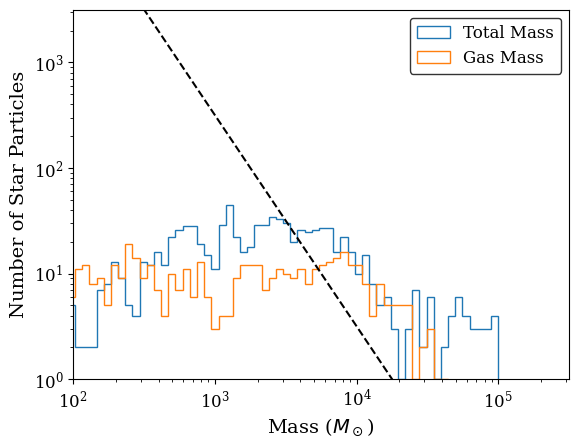

In [5]:
f,ax = plt.subplots()

ax.hist(( mstar )*m0/modot,bins=10**np.linspace(1,5,80),
         histtype='step',fill=False,stacked=False, label='Total Mass')
ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
         histtype='step',fill=False,stacked=False, label='Gas Mass')
ax.set_xscale('log')
ax.set_yscale('log')
x = 10**np.linspace(2,5,100)
ax.plot(x, 10**8.5*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**2,10**5.5])
ax.set_ylim([1e0,10**3.5])
ax.set_ylabel("Number of Star Particles")
ax.legend()
#plt.savefig("mass_spectrum_10.png",dpi=300)
#plt.legend()

In [93]:
np.sqrt( 3 * np.pi / ( 32 * G * 5000 * rho0 ) ) / yr

728314.041459171

file: ../cmz_test/outputs/cmz_fb2_146mod_00021.bin; time = 210.001
file: ../cmz_test/outputs/cmz_fb3_146mod_00021.bin; time = 210
file: ../cmz_test/outputs/cmz_fb4_146mod_00021.bin; time = 210


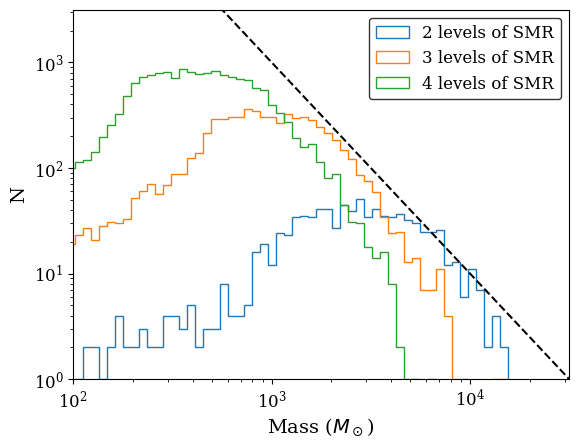

In [64]:
i = 21
fstring = (5 - len(str(i)))*"0" + str(i)
for j in ['2','3', '4']:
    d  = get_last_dd( f'../cmz_test/outputs/cmz_fb{j}_146mod_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
    d.load_particles()
    m          = d.data[ 'particle_m' ].T;
    x,   y,  z = d.data[ 'particle_x' ].T;
    vx, vy, vz = d.data[ 'particle_v' ].T;
    r = np.sqrt( x**2 + y**2 + z**2 )
    mstar      = d.data['particle_mstar'].T
    plt.hist(mstar[r < 500]*m0/modot,bins=10**np.linspace(1,5,100),
         histtype='step',fill=False,stacked=False,label=f'{j} levels of SMR')
plt.xscale('log')
plt.yscale('log')
x = 10**np.linspace(2,5,100)
plt.plot(x, 1e9*x**-2, '--k')
plt.xlim([10**2,10**4.5])
plt.ylim([1e0,10**3.5])
plt.xlabel(r"Mass ($M_\odot$)")
plt.ylabel("N")
plt.legend()
plt.savefig("mass_spec_resolution_test.png",dpi=300,bbox_inches='tight')


In [18]:
testrho = 6000 * rho0
dx = 2*pc
SFE = 0.96 * ( testrho * dx**3 / modot )**(-0.4/1.4)
cellmass = testrho * dx**3
partmass = SFE*cellmass
for i in range(10):
    SFE = 0.96 * ( partmass / modot )**-0.4
    partmass = SFE * cellmass
    print( SFE, partmass / modot )

0.12914117627384014 153.14673587230627
0.1283004368530904 152.14971461447
0.12863607380874612 152.5477418407963
0.128501713790813 152.38840615273838
0.12855544094913304 152.45212044713944
0.12853394739070217 152.4266315332938
0.1285425443828124 152.43682658740425
0.12853910551696932 152.43274848393511
0.1285404810522665 152.43437971223057
0.12853993083638124 152.43372721881764


In [35]:
100**-0.4

0.15848931924611134

In [7]:
np.sum( sfr[ ( r < 500 ) & ( SFdelay == 0 ) ] ) * ( m0 / t0 / modot * yr )

np.float32(0.065097705)

In [6]:
mgas = m - mstar
np.sum( sfr[ ( r < 500 ) & ( SFdelay == 0 ) & ( mgas > 0 ) ] ) * ( m0 / t0 / modot * yr )

np.float32(0.07080813)

In [9]:
np.sum( mstar[ r < 500 ] ) * ( m0 / modot )

np.float32(419138.56)

In [14]:
import re

outname = "../cmz/cmz_test/cmz_particle_test.out"

data = []

cycle_re = re.compile(r"cycle\s*=\s*(\d+)")
t_re     = re.compile(r"(?:^|,)\s*t\s*=\s*([0-9.eE+-]+)")
npar_re  = re.compile(r"n_par\s*=\s*(\d+)")

current_cycle = None
current_t = None

with open(outname) as f:
    for line in f:
        if "cycle =" in line:
            cm = cycle_re.search(line)
            tm = t_re.search(line)
            if cm and tm:
                current_cycle = int(cm.group(1))
                current_t = float(tm.group(1))

        elif "n_par =" in line and current_t is not None:
            nm = npar_re.search(line)
            if nm:
                npar = int(nm.group(1))
                data.append((current_t, current_cycle, npar))

# sort by t
data.sort(key=lambda x: x[0])

cycle_re  = re.compile(r"cycle\s*=\s*(\d+).*?(?:^|,)\s*t\s*=\s*([0-9.eE+-]+)")
create_re = re.compile(r"(\d+)\s+particles\s+created")

rows = []

current_cycle = None
current_t = None
created_sum = 0

with open(outname) as f:
    for line in f:
        m = cycle_re.search(line)
        if m:
            # flush previous cycle ONLY if particles were created
            if current_cycle is not None and created_sum > 0:
                rows.append((current_cycle, current_t, created_sum))

            current_cycle = int(m.group(1))
            current_t = float(m.group(2))
            created_sum = 0
            continue

        m = create_re.search(line)
        if m and current_cycle is not None:
            created_sum += int(m.group(1))

# flush last cycle
if current_cycle is not None and created_sum > 0:
    rows.append((current_cycle, current_t, created_sum))

datapart = np.array( rows )

Text(0.5, 1.0, 'Particle test <2kpc')

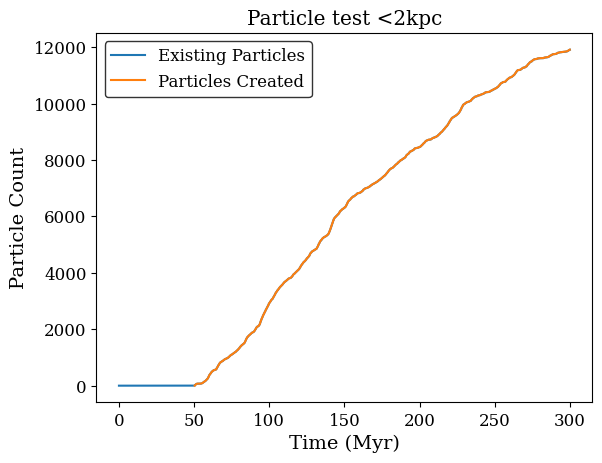

In [15]:
data = np.array(data)
plt.plot(data[:,0], data[:,2], label="Existing Particles")
plt.plot(datapart[:,1], np.cumsum( datapart[:,2]), label='Particles Created' )
#for i in range( 24 ):
#    plt.axvline( i*10, color='k', linestyle='--', alpha=0.5 )
plt.xlabel("Time (Myr)")
plt.ylabel("Particle Count")
plt.legend()
plt.title("Particle test <2kpc")

In [4]:
dirname = 'cmz/cmz_test/outputs'
outputnames = ['cmz_fb1_mergefull', 'cmz_fb2_mergefull', 'cmz_fb3_mergefull', "cmz_fb4_mergefull"]#,'cmz_fb3_test']#,'cmz_fb3_146mod','cmz_fb4_146mod']
#outputnames = ['cmz_vert']#,'cmz_fb4_146mod']#,'cmz_fb4_146mod']
plotlabels = outputnames#[r'$\Delta x$ = 23.4 pc',r'$\Delta x$ = 11.7 pc']#,r'$\Delta x$ = 5.9 pc' ]
R_out = 500
SFRArr   = []
MstarArr = []
NsneArr  = []
McmzArr  = []
timeArr  = []
velArr   = []
MpartArr = []
veldispArr = []
maxout = 26
for j in outputnames:
    SFRArr.append([])
    MstarArr.append([])
    MpartArr.append([])
    NsneArr.append([])
    McmzArr.append([])
    timeArr.append([])
    velArr.append([])
    veldispArr.append([])
for j, k in enumerate(outputnames):
    for i in range(maxout + 1):
        fstring = (5 - len(str(i)))*"0" + str(i)
        try:
            d  = get_last_dd( f'../{dirname}/{k}_{fstring}.bin', -1, enroll_prim=True, data_type = cmz_data );
        except IndexError:
            print( f'../{dirname}/{k}_{fstring}.bin not found' )
            continue
        d.load_particles(  )
        x,   y,  z = d.data[ 'particle_x' ].T;
        vx, vy, vz = d.data[ 'particle_v' ].T;
        m          = d.data[ 'particle_m' ].T;
        mstar      = d.data[ 'particle_mstar'].T
        sfr        = d.data[ 'particle_sfr' ].T;
        age        = d.data[ 'particle_age' ].T;
        Nsne       = d.data[ 'particle_Nsne' ].T
        tcreate    = d.data[ 'particle_tcreate' ].T;
        SFdelay    = d.data[ 'particle_SFdelay' ].T;
        r = np.sqrt( x**2 + y**2 + z**2 )

        cmz_mass0 = 0
        mass_sum = 0
        mom_sum = 0
        mom_arr = np.array([])
        mass_arr = np.array([])
        for keys, bd in d.data.items():
            if keys[0:5] != 'block':
                continue
            Xb, Yb, Zb = np.meshgrid( bd['x_c'][0], 
                                      bd['x_c'][1], 
                                      bd['x_c'][2], indexing='ij' )
            R2 = ( Xb**2 + Yb**2 + Zb**2 ) ** 0.5
            masses = (bd['rho']*np.prod(bd['dx'],axis=0))[R2 < R_out]
            mass_arr = np.concatenate((mass_arr, masses))
            if len(masses) == 0:
                continue
            mass_sum += np.sum(masses)
            cmz_mass0 += np.sum(masses)*rho0*(l0**3)/modot

            net_mom_ = np.sqrt(bd['mom'][0]**2 + bd['mom'][1]**2 + bd['mom'][2]**2)[R2 < R_out]
            net_vel = net_mom_ / bd['rho'][R2 < R_out]
            net_mom = net_vel * masses
            mom_sum += np.sum( net_mom  )
            
            mom_arr = np.concatenate((mom_arr,net_mom))

        SFRArr[j]  .append( np.sum( sfr[ ( r < R_out ) & ( SFdelay == 0 ) ] ) / t0 * m0 / modot * yr  );
        MstarArr[j].append( np.sum( mstar[ r < R_out ] ) * ( m0 / modot ) );
        NsneArr[j] .append( np.sum( Nsne[ r < R_out ] ) );
        timeArr[j] .append(d.globals['time'] * t0 / yr)
        McmzArr[j] .append(cmz_mass0 + np.sum( ( m - mstar )[ r < R_out ] )* ( m0 / modot ) ) 
        velArr[j]  .append( mom_sum/mass_sum * l0/t0 /1e5 )
        veldispArr[j].append( np.sqrt(np.cov(mom_arr/mass_arr, aweights=mass_arr)) * l0/t0 /1e5 )
        MpartArr[j].append( np.sum( m[ r < R_out ] ) * ( m0 / modot ) );
#SFRArr   = np.array( SFRArr ) 
#MstarArr = np.array( MstarArr )
#MpartArr = np.array( MpartArr )
#NsneArr  = np.array( NsneArr )
#McmzArr  = np.array( McmzArr )
#timeArr  = np.array( timeArr )
#velArr = np.array( velArr )
#veldispArr = np.array( veldispArr )

file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00000.bin; time = 0
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00001.bin; time = 10.0241
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00002.bin; time = 20.0025
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00003.bin; time = 30.0083
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00004.bin; time = 40.0182
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00005.bin; time = 50.0106
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00006.bin; time = 60.0008
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00007.bin; time = 70.0057
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00008.bin; time = 80.002
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00009.bin; time = 90.0005
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00010.bin; time = 100.002
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00011.bin; time = 110
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_00012.bin; time = 120.001
file: ../cmz/cmz_test/outputs/cmz_fb1_mergefull_0

In [14]:
len( SFdelay[ SFdelay == 0 ] ) / len( SFdelay )

0.050359712230215826

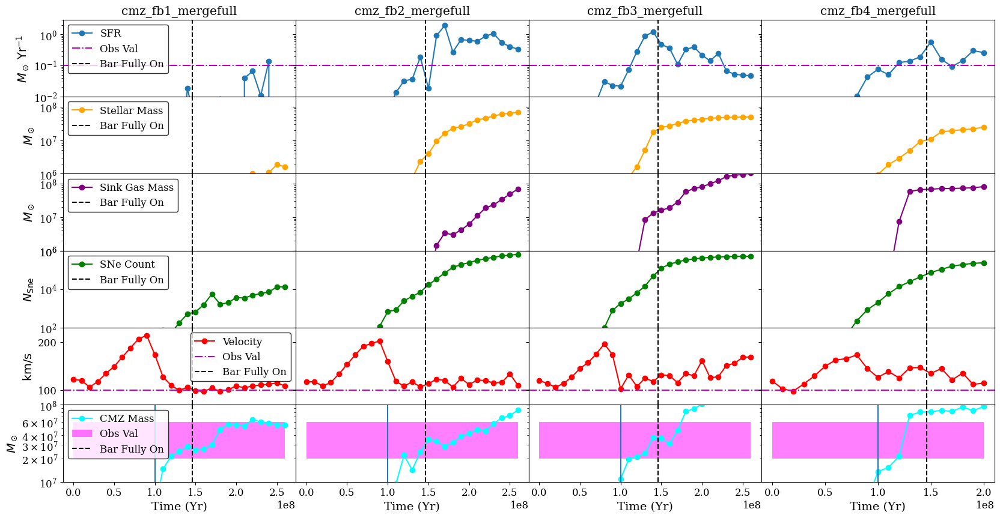

In [ ]:
plotcount = 6
#plotlabels = [r'$\Delta x$ = 23.4 pc',r'$\Delta x$ = 11.7 pc']#,r'$\Delta x$ = 5.9 pc' ]
#plotlabels = ["PI cool", "PI_nocool"]
f,ax=plt.subplots(plotcount,len(outputnames),figsize=(5*len(outputnames),10), sharex='col',sharey='row')
plt.subplots_adjust(hspace=0, wspace=0)
for i,j in enumerate(plotlabels):
    ax[0,i].set_title(j)
for j, k in enumerate(outputnames):
    s1 = ax[0,j].plot(timeArr[j], SFRArr[j], 'o-',label='SFR')
    ax[0,j].axhline(0.1, color='m',linestyle='-.',label='Obs Val')

    s2 = ax[1,j].plot(timeArr[j], MstarArr[j], 'o-', color='orange',label='Stellar Mass')
    
    s3 = ax[2,j].plot(timeArr[j], np.array( MpartArr[j] ) - np.array( MstarArr[j] ), 'o-', color='purple',label='Sink Gas Mass')

    s4 = ax[3,j].plot(timeArr[j], NsneArr[j], 'o-', color='green',label='SNe Count')
    
    s5 = ax[4,j].plot(timeArr[j], velArr[j], 'o-', color='red',label='Velocity')
    ax[4,j].axhline(100, color='m',linestyle='-.',label='Obs Val')
    
    #s6 = ax[5,j].plot(timeArr[j], veldispArr[j], 'o-', color='magenta',label='Velocity Dispersion')

    s7 = ax[5,j].plot(timeArr[j], McmzArr[j], 'o-', color='cyan',label='CMZ Mass')
    #s7 = ax[6,j].plot(timeArr[j], McmzArr[j] + MpartArr[j] - MstarArr[j], 'o-', color='yellow',label='CMZ Mass (including sink gas)')

    #ax[6,j].axhline(6e7, color='m',linestyle='-.',label='Obs Val')
    ax[5,j].fill_between( timeArr[j], 2e7, 6e7, facecolor='magenta',alpha=0.5, label='Obs Val')
    ax[-1,j].set_xlabel(r'Time (Yr)')
    for i in range(plotcount):
        ax[i,j].axvline(1.46e8, color='k', linestyle='--', label='Bar Fully On')
        #ax[i,j].axvline(2.1e8, color='lime', linestyle='--')
        if j == 0:
            ax[i,j].legend()
        
    if j == 0:
        ax[0,j].set_ylabel(r'$M_\odot \; \mathrm{Yr}^{-1}$')
        ax[1,j].set_ylabel(r'$M_\odot$')
        ax[2,j].set_ylabel(r'$M_\odot$')
        ax[3,j].set_ylabel(r'$N_\mathrm{Sne}$')
        ax[4,j].set_ylabel(r'$\mathrm{km}/\mathrm{s}$')
        #ax[5,j].set_ylabel(r'$\mathrm{km}/\mathrm{s}$')
        ax[5,j].set_ylabel(r'$M_\odot$')
#plt.savefig("resolution_convergence.png",dpi=300, bbox_inches='tight')
    for k in [ 0, 1, 2, 3, 5 ]:
        ax[ k, 0 ].set_yscale( 'log' )
    ax[0,0].set_ylim( [ 1e-2, 3e0 ] )
    ax[1,0].set_ylim( [ 1e6, 2e8 ] )
    ax[2,0].set_ylim( [ 1e6, 2e8 ] )
    ax[3,0].set_ylim( [ 1e2, 1e6 ] )
    ax[4,0].set_ylim( [ 70, 230 ] )
    ax[5,0].set_ylim( [ 1e7, 1e8 ] )

In [ ]:
output_data = time_evo( "../cmz/cmz_test/outputs",
                        "cmz_fb3",
                         max_out     = 23,
                         data_names  = [ "SFR" , "Mstar", "Mgas", 
                                        "Nsne", "vphi" , "Mcmz" ],
                         data_funcs  = [ f_par_SFR , f_par_Mstar, f_par_Mgas,
                                        f_par_Nsne, f_blk_cmzvel, f_blk_cmzmass ],
                         blk_funcs   = [ None, None, None, None, 
                                        bf_hyd_cmzvel, bf_hyd_cmzmass ],
                         kwargs_all  = { "R_out" : 500, "Z_out": 140 },
                         unit_labels = [ r'$M_\odot \; \mathrm{Yr}^{-1}$', r'$M_\odot$', r'$M_\odot$',
                                         r'$N$', r'$\mathrm{km}/\mathrm{s}$', r'$M_\odot$' ] )

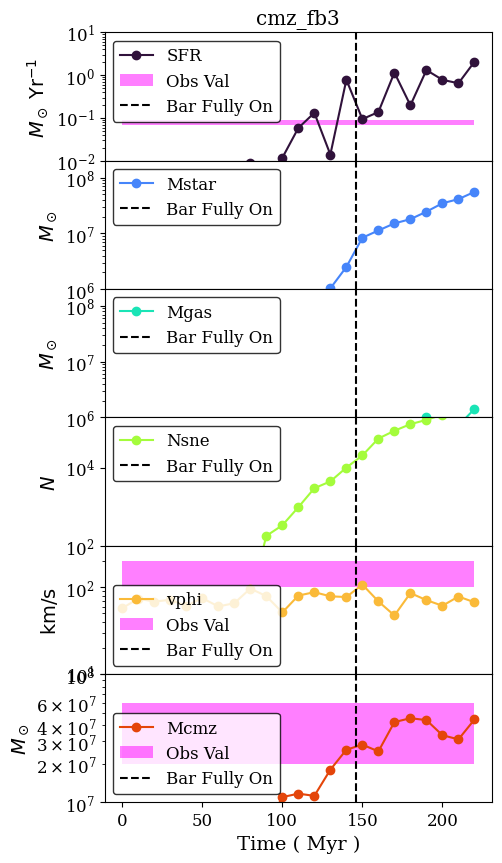

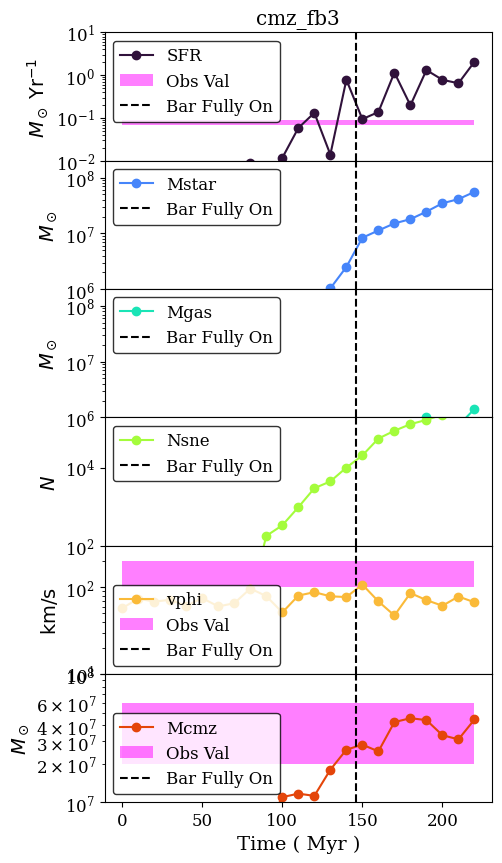

In [9]:
plt_time_evo( output_data, ylims = [ [ 1e-2, 1e1 ], [ 1e6, 2e8 ], [ 1e6, 2e8 ], 
                                     [ 1e2, 2e5 ] , [ 1e1, 3e2 ], [ 1e7, 1e8 ] ],
                           fplot = [ draw_obs_val, draw_bar_on , draw_bar_on,
                                     draw_bar_on , draw_obs_val, draw_obs_val ] ,
                           fplot_kwargs = [ { "bar_on_time" : 146, "low" : 0.07, "high" : 0.09 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146 },
                                            { "bar_on_time" : 146, "low" : 100, "high" : 200 },
                                            { "bar_on_time" : 146, "low" : 2e7, "high" : 6e7 }  ] )